<font color="red" size=5><center>FIFA - EDA and Linear Regression Starter</center></font>

# Introduction

<a class="anchor" id="toc"></a>

EA Sports FC 24 is an association football-themed simulation video game developed by EA Vancouver and EA Romania and published by EA Sports. It is the inaugural installment in the EA Sports FC series, succeeding the FIFA video game series after Electronic Arts's partnership with FIFA concluded with FIFA 23. EA Sports FC 24 is the 31st overall installment of EA Sports' football simulation games, and was released on 29 September 2023 for Nintendo Switch, PlayStation 4, PlayStation 5, Windows, Xbox One, and Xbox Series X/S.


*Source: [Wikipedia](https://en.wikipedia.org/wiki/EA_Sports_FC_24)*


![Image](https://assets.goal.com/v3/assets/bltcc7a7ffd2fbf71f5/blt674314efe488e9a4/64b13f0acc7487ee6e3bea1c/fc24.jpg?auto=webp&format=pjpg&width=3840&quality=60)

# Table of Contents
1. [Glimpse of the data at hand](#1)
2. [Data Cleaning](#2)
3. [Data Analysis](#3)
4. [Exploratory Data Analysis](#4)
5. [Modelling](#5)

In [4]:
!pip install numpy
!pip install pandas
!pip install eli5
!pip install missingno
!pip install warnings
!pip install plotly
!pip install seaborn

ERROR: Could not find a version that satisfies the requirement warnings (from versions: none)
ERROR: No matching distribution found for warnings


----------------------------------------------------------------------------------------------------------------------------------------------
<a id ="1" > </a>
# 1. Glimpse of the data at hand

In [5]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import eli5
from eli5.sklearn import PermutationImportance
from collections import Counter
import missingno as msno

import warnings
warnings.filterwarnings('ignore')
import plotly
sns.set_style('darkgrid')

In [6]:
data=pd.read_csv('/Users/washi/Developer/fifa_data_fifa24.csv')

In [7]:
# Step 2: Filter the Data for FIFA 24 Version
df = data[data['fifa_version'] == 24]

# Step 3: Save Filtered Data to a New CSV File
df.to_csv('fifa_data_fifa24.csv', index=False)

In [8]:
df.head(10).T

,0,1,2,3,4,5,6,7,8,9
player_id,231747,239085,192985,158023,165153,188545,192119,202126,238794,212831
player_url,/player/231747/kylian-mbappe/240002,/player/239085/erling-haaland/240002,/player/192985/kevin-de-bruyne/240002,/player/158023/lionel-messi/240002,/player/165153/karim-benzema/240002,/player/188545/robert-lewandowski/240002,/player/192119/thibaut-courtois/240002,/player/202126/harry-kane/240002,/player/238794/vinicius-jose-de-oliveira-junio...,/player/212831/alisson-ramses-becker/240002
fifa_version,24.0,24.0,24.0,24.0,24.0,24.0,24.0,24.0,24.0,24.0
fifa_update,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
update_as_of,2023-09-22,2023-09-22,2023-09-22,2023-09-22,2023-09-22,2023-09-22,2023-09-22,2023-09-22,2023-09-22,2023-09-22
...,...,...,...,...,...,...,...,...,...,...
lcb,54+3,62+3,70+3,49+3,55+3,61+3,29+3,63+3,45+3,33+3
cb,54+3,62+3,70+3,49+3,55+3,61+3,29+3,63+3,45+3,33+3
rcb,54+3,62+3,70+3,49+3,55+3,61+3,29+3,63+3,45+3,33+3
rb,63+3,60+3,75+3,59+3,60+3,61+3,29+3,64+3,57+3,33+3


In [9]:
df.columns

Index(['player_id', 'player_url', 'fifa_version', 'fifa_update',
       'update_as_of', 'short_name', 'long_name', 'player_positions',
       'overall', 'potential',
       ...
       'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb', 'gk'],
      dtype='object', length=109)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18350 entries, 0 to 18349
Columns: 109 entries, player_id to gk
dtypes: float64(20), int64(43), object(46)
memory usage: 15.3+ MB


In [11]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
player_id,18350.0,242440.726322,26741.238580,18115.0,225442.0,245467.5,264169.5,278145.0
fifa_version,18350.0,24.000000,0.000000,24.0,24.0,24.0,24.0,24.0
fifa_update,18350.0,2.000000,0.000000,2.0,2.0,2.0,2.0,2.0
overall,18350.0,65.817057,6.817917,47.0,62.0,66.0,70.0,91.0
potential,18350.0,71.088065,6.220982,48.0,67.0,71.0,75.0,94.0
...,...,...,...,...,...,...,...,...
goalkeeping_handling,18350.0,16.124578,16.945031,2.0,8.0,11.0,14.0,90.0
goalkeeping_kicking,18350.0,16.035095,16.699136,2.0,8.0,11.0,14.0,91.0
goalkeeping_positioning,18350.0,16.168392,17.093683,2.0,8.0,11.0,14.0,90.0
goalkeeping_reflexes,18350.0,16.423815,17.880726,2.0,8.0,11.0,14.0,93.0


In [12]:
num_rows = len(data)
print("Number of rows using len():", num_rows)

Number of rows using len(): 18350


<a id="2"></a> 
# 2. Data Cleaning

In [13]:
#df.drop(['Unnamed: 0','Photo','Flag','Club Logo'],axis=1,inplace=True)

<Axes: >

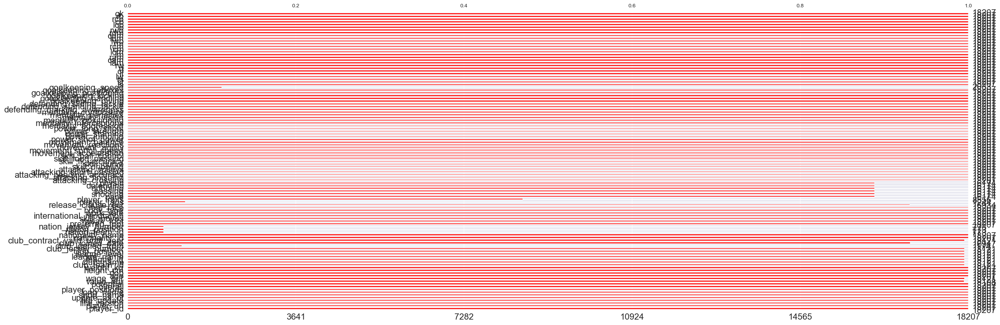

In [14]:
msno.bar(df.sample( 18207 ),(28,10),color='red')

In [15]:
df.isnull().sum()

player_id       0
player_url      0
fifa_version    0
fifa_update     0
update_as_of    0
               ..
lcb             0
cb              0
rcb             0
rb              0
gk              0
Length: 109, dtype: int64

`48` is repeating many times lets check if all of them are same `ID` or not

In [16]:
missing_height = df[df['height_cm'].isnull()].index.tolist()
missing_weight = df[df['weight_kg'].isnull()].index.tolist()
if missing_height == missing_weight:
    print('They are same')
else:
    print('They are different')

They are same


As they are same I am assuming it will be same for other all columns too. 

We will see it soon. 

In [17]:
df.drop(df.index[missing_height],inplace =True)

In [18]:
# Set display option to show all rows
pd.set_option('display.max_rows', None)

# Display the count of missing values for each column
print(df.isnull().sum())

# Reset display options to default
pd.reset_option('display.max_rows')


player_id                             0
player_url                            0
fifa_version                          0
fifa_update                           0
update_as_of                          0
short_name                            0
long_name                             0
player_positions                      0
overall                               0
potential                             0
value_eur                           100
wage_eur                             87
age                                   0
dob                                   0
height_cm                             0
weight_kg                             0
club_team_id                         87
club_name                            87
league_id                            87
league_name                          87
league_level                         87
club_position                        87
club_jersey_number                   87
club_loaned_from                  17170
club_joined_date                   1267


As we can see, we guessed right and now we have fewer null values.

<a id="3"></a>
# 3. Data Analysis

In [19]:
#Number of countries available and top 5 countries with highest number of players
print('Total number of countries : {0}'.format(df['nationality_name'].nunique()))
print(df['nationality_name'].value_counts().head(5))
print('--'*40)
print("\nEuropean Countries have most players")

Total number of countries : 160
nationality_name
England      1615
Germany      1189
Spain        1051
Argentina     970
France        935
Name: count, dtype: int64
--------------------------------------------------------------------------------

European Countries have most players


In [20]:
#Total number of clubs present and top 5 clubs with highest number of players
print('Total number of clubs : {0}'.format(df['club_name'].nunique()))
print(df['club_name'].value_counts().head(5))

Total number of clubs : 670
club_name
Liverpool           53
River Plate         49
Sheffield United    33
West Ham United     33
Celta de Vigo       33
Name: count, dtype: int64


In [21]:
max_potential_indices = df.index[df['potential'] == df['potential'].max()]
max_overall_indices = df.index[df['overall'] == df['overall'].max()]

# Print all players with maximum potential
print("Players with Maximum Potential:")
for index in max_potential_indices:
    print('- ' + str(df.loc[index][6]))

# Print all players with maximum overall performance
print("\nPlayers with Maximum Overall Performance:")
for index in max_overall_indices:
    print('- ' + str(df.loc[index][6]))

Players with Maximum Potential:
- Kylian Mbappé Lottin
- Erling Braut Haaland
- Vinícius José Paixão de Oliveira Júnior

Players with Maximum Overall Performance:
- Kylian Mbappé Lottin
- Erling Braut Haaland
- Kevin De Bruyne


In [22]:
pr_cols=['pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic', 
    'attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy', 
    'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 
    'skill_curve', 'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 
    'movement_acceleration', 'movement_sprint_speed', 'movement_agility', 
    'movement_reactions', 'movement_balance', 'power_shot_power', 'power_jumping', 
    'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression', 
    'mentality_interceptions', 'mentality_positioning', 'mentality_vision', 
    'mentality_penalties', 'mentality_composure', 'defending_marking_awareness', 
    'defending_standing_tackle', 'defending_sliding_tackle', 'goalkeeping_diving', 
    'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioning', 
    'goalkeeping_reflexes', 'goalkeeping_speed'
]
# Dictionary mapping your column names to actual names for display
column_mapping = {
    'pace': 'Pace', 
    'shooting': 'Shooting', 
    'passing': 'Passing', 
    'dribbling': 'Dribbling', 
    'defending': 'Defending', 
    'physic': 'Physical', 
    'attacking_crossing': 'Crossing', 
    'attacking_finishing': 'Finishing', 
    'attacking_heading_accuracy': 'Heading Accuracy', 
    'attacking_short_passing': 'Short Passing', 
    'attacking_volleys': 'Volleys', 
    'skill_dribbling': 'Dribbling Skills', 
    'skill_curve': 'Curve', 
    'skill_fk_accuracy': 'FK Accuracy', 
    'skill_long_passing': 'Long Passing', 
    'skill_ball_control': 'Ball Control', 
    'movement_acceleration': 'Acceleration', 
    'movement_sprint_speed': 'Sprint Speed', 
    'movement_agility': 'Agility', 
    'movement_reactions': 'Reactions', 
    'movement_balance': 'Balance', 
    'power_shot_power': 'Shot Power', 
    'power_jumping': 'Jumping', 
    'power_stamina': 'Stamina', 
    'power_strength': 'Strength', 
    'power_long_shots': 'Long Shots', 
    'mentality_aggression': 'Aggression', 
    'mentality_interceptions': 'Interceptions', 
    'mentality_positioning': 'Positioning', 
    'mentality_vision': 'Vision', 
    'mentality_penalties': 'Penalties', 
    'mentality_composure': 'Composure', 
    'defending_marking_awareness': 'Marking Awareness', 
    'defending_standing_tackle': 'Standing Tackle', 
    'defending_sliding_tackle': 'Sliding Tackle', 
    'goalkeeping_diving': 'Diving', 
    'goalkeeping_handling': 'Handling', 
    'goalkeeping_kicking': 'Kicking', 
    'goalkeeping_positioning': 'Positioning (GK)', 
    'goalkeeping_reflexes': 'Reflexes', 
    'goalkeeping_speed': 'Speed (GK)'
}

# Now, you can use this dictionary to print the actual names in your output
print('BEST IN DIFFERENT ASPECTS :')
print('_________________________\n\n')
i = 0
while i < len(pr_cols):
    aspect = column_mapping.get(pr_cols[i], pr_cols[i])
    print('Best {0} : {1}'.format(aspect, df.loc[df[pr_cols[i]].idxmax()][6]))
    i += 1


BEST IN DIFFERENT ASPECTS :
_________________________


Best Pace : Kylian Mbappé Lottin
Best Shooting : Erling Braut Haaland
Best Passing : Kevin De Bruyne
Best Dribbling : Lionel Andrés Messi Cuccittini
Best Defending : Rúben dos Santos Gato Alves Dias
Best Physical : João Maria Lobo Alves Palhinha Gonçalves
Best Crossing : Kevin De Bruyne
Best Finishing : Erling Braut Haaland
Best Heading Accuracy : Luuk de Jong
Best Short Passing : Kevin De Bruyne
Best Volleys : Lautaro Javier Martínez
Best Dribbling Skills : Lionel Andrés Messi Cuccittini
Best Curve : Lionel Andrés Messi Cuccittini
Best FK Accuracy : James Ward-Prowse
Best Long Passing : Kevin De Bruyne
Best Ball Control : Neymar da Silva Santos Júnior
Best Acceleration : Kylian Mbappé Lottin
Best Sprint Speed : Kylian Mbappé Lottin
Best Agility : Bernardo Mota Veiga de Carvalho e Silva
Best Reactions : Erling Braut Haaland
Best Balance : Lionel Andrés Messi Cuccittini
Best Shot Power : Erling Braut Haaland
Best Jumping : Iñaki Wi

In [23]:
df.head().T

,0,1,2,3,4
player_id,231747,239085,192985,158023,165153
player_url,/player/231747/kylian-mbappe/240002,/player/239085/erling-haaland/240002,/player/192985/kevin-de-bruyne/240002,/player/158023/lionel-messi/240002,/player/165153/karim-benzema/240002
fifa_version,24.0,24.0,24.0,24.0,24.0
fifa_update,2.0,2.0,2.0,2.0,2.0
update_as_of,2023-09-22,2023-09-22,2023-09-22,2023-09-22,2023-09-22
...,...,...,...,...,...
lcb,54+3,62+3,70+3,49+3,55+3
cb,54+3,62+3,70+3,49+3,55+3
rcb,54+3,62+3,70+3,49+3,55+3
rb,63+3,60+3,75+3,59+3,60+3


In [24]:
#Top earners
print('Most valued player : '+str(df.loc[df['value_eur'].idxmax()][6]))
print("--"*40)
mvps = df.nlargest(20, 'value_eur')[['short_name', 'value_eur']]

for index, player in mvps.iterrows():
    print(f"{player['short_name']}: {player['value_eur']}")

print("")
print('Highest earner : '+str(df.loc[df['wage_eur'].idxmax()][6]))
print("--"*40)
print("\nTop Earners")
top_earners = df.nlargest(20, 'wage_eur')[['short_name', 'wage_eur']]

for index, player in top_earners.iterrows():
    print(f"{player['short_name']}: {player['wage_eur']}")

Most valued player : Erling Braut Haaland
--------------------------------------------------------------------------------
E. Haaland: 185000000.0
K. Mbappé: 181500000.0
Vini Jr.: 158500000.0
J. Musiala: 134500000.0
F. Valverde: 130500000.0
V. Osimhen: 126500000.0
H. Kane: 119500000.0
M. Ødegaard: 109000000.0
K. Kvaratskhelia: 109000000.0
L. Martínez: 107000000.0
Rúben Dias: 106500000.0
Rodri: 105500000.0
Pedri: 105000000.0
F. de Jong: 103500000.0
K. De Bruyne: 103000000.0
Rafael Leão: 102500000.0
J. Bellingham: 100500000.0
B. Saka: 99000000.0
R. Araujo: 93000000.0
Bruno Fernandes: 92000000.0

Highest earner : Kevin De Bruyne
--------------------------------------------------------------------------------

Top Earners
K. De Bruyne: 350000.0
E. Haaland: 340000.0
R. Lewandowski: 340000.0
Vini Jr.: 310000.0
F. Valverde: 270000.0
Bernardo Silva: 270000.0
M. Salah: 260000.0
Bruno Fernandes: 260000.0
T. Courtois: 250000.0
Rodri: 250000.0
Rúben Dias: 250000.0
Casemiro: 240000.0
F. de Jong: 24

<a id="4"></a> <br>
# 4. Exploratory Data Analysis

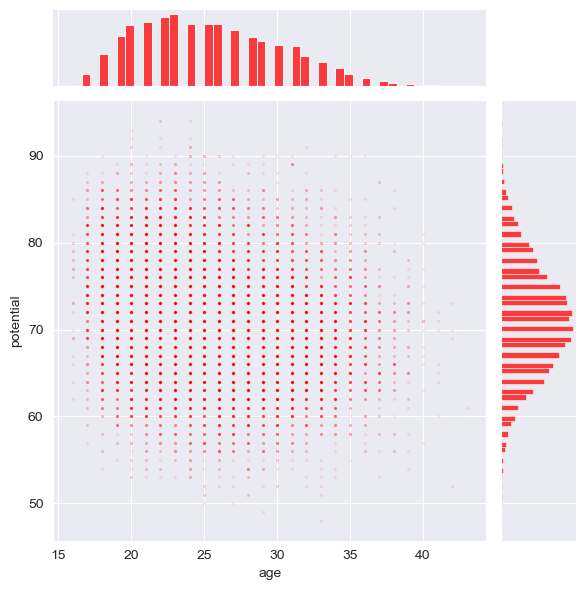

In [25]:
sns.jointplot(x=df['age'],y=df['potential'],
              joint_kws={'alpha':0.1,'s':5,'color':'red'},
              marginal_kws={'color':'red'})



`Potential` tends to fall as you grow old

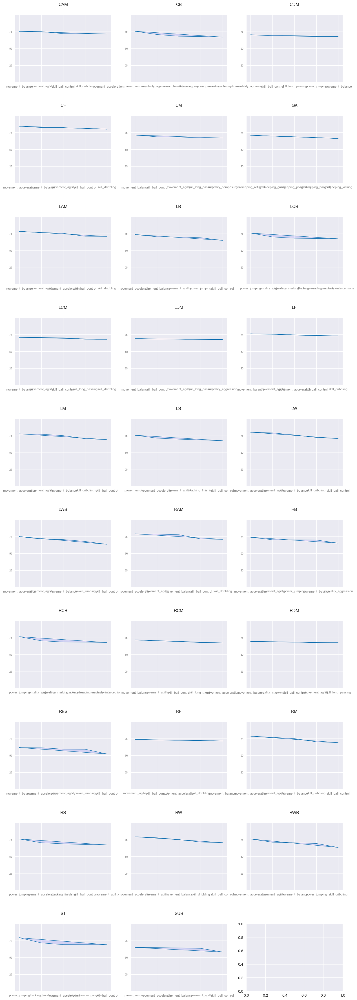

In [26]:
from math import pi
import matplotlib.pyplot as plt
import seaborn as sns  # Import seaborn library

# Define player features as a list
player_features = [
    'movement_acceleration', 'mentality_aggression', 'movement_agility', 
    'movement_balance', 'skill_ball_control', 'mentality_composure', 
    'attacking_crossing', 'skill_dribbling', 'skill_fk_accuracy', 
    'attacking_finishing', 'goalkeeping_diving', 'goalkeeping_handling', 
    'goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes', 
    'attacking_heading_accuracy', 'mentality_interceptions', 'power_jumping', 
    'skill_long_passing', 'power_long_shots', 'defending_marking_awareness', 'mentality_penalties'
]

# Create subplots
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(15, 45))
fig.subplots_adjust(hspace=0.5)

# Iterate over positions and plot radar chart for each
for ax, (position_name, features) in zip(axes.flatten(), df.groupby(df['club_position'])[player_features].mean().iterrows()):
    top_features = dict(features.nlargest(5))

    # Number of variables
    categories = list(top_features.keys())
    N = len(categories)

    # Values
    values = list(top_features.values())
    values += values[:1]

    # Angles for radar chart
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]

    # Plot radar chart
    ax.plot(angles, values, linewidth=1, linestyle='solid')
    ax.fill(angles, values, 'b', alpha=0.1)

    # Set labels and title
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories, color='grey', size=8)
    ax.set_yticks([25, 50, 75])
    ax.set_yticklabels(["25", "50", "75"], color="grey", size=7)
    ax.set_ylim(0, 100)
    ax.set_title(position_name, size=11, y=1.1)

plt.show()


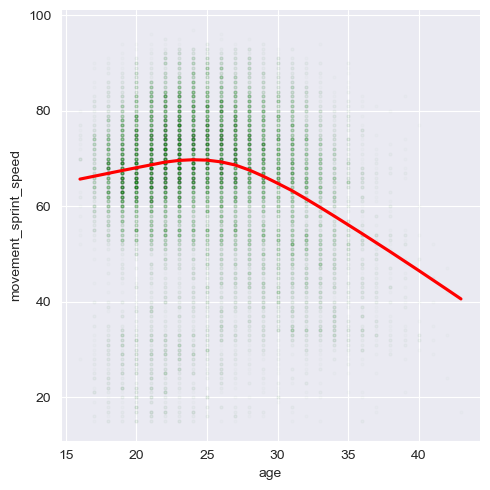

In [27]:
sns.lmplot(data = df, x = 'age', y = 'movement_sprint_speed',lowess=True,scatter_kws={'alpha':0.01, 's':5,'color':'green'}, 
           line_kws={'color':'red'})

As the `age` increases the `sprint speed` decreases

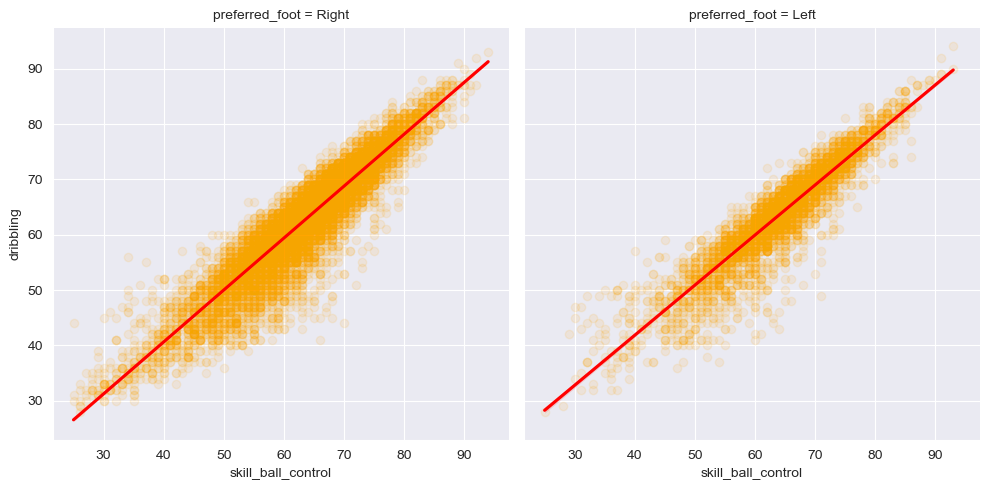

In [28]:
sns.lmplot(x = 'skill_ball_control', y = 'dribbling', data = df,col = 'preferred_foot',scatter_kws = {'alpha':0.1,'color':'orange'},
           line_kws={'color':'red'})

`Left Footed Players` vs `Right Footed Players`

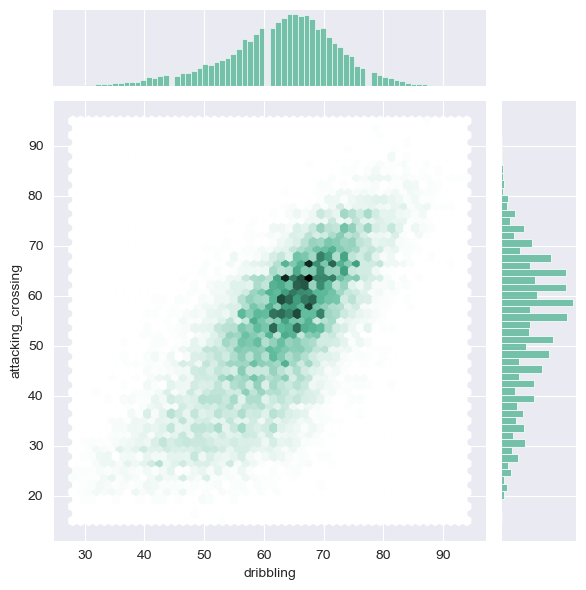

In [29]:

sns.jointplot(x=df['dribbling'], y=df['attacking_crossing'], kind="hex", color="#4CB391");

`Crossing` vs `Dribbling`

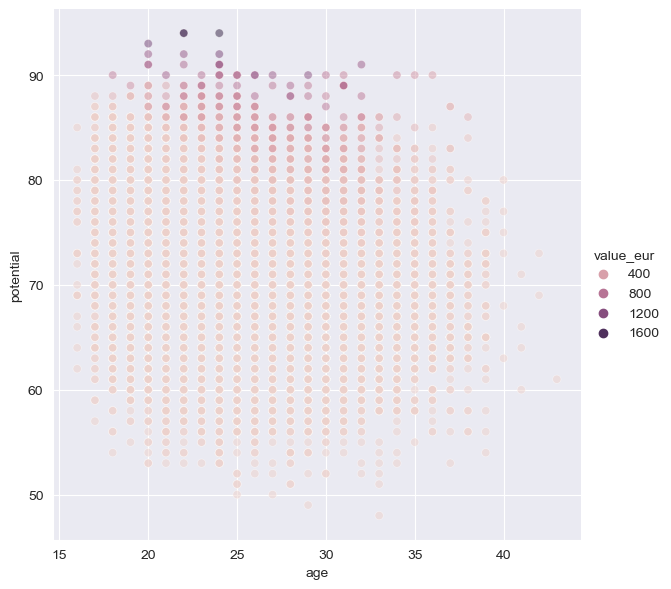

In [30]:
value = df['value_eur']
cmap = sns.cubehelix_palette(rot=-.2, as_cmap=True)

sns.relplot(x="age", y="potential", hue=value/100000, 
            sizes=(40, 400), alpha=.5,
            height=6, data=df);

Relation between `potential` and `age` with respected `value` of players

**Lowest correlation** among the goalkeeping side with other columns and high among themselves 

**High correlation** between `Dribbling`, `Volleys`, `Passing` etc...

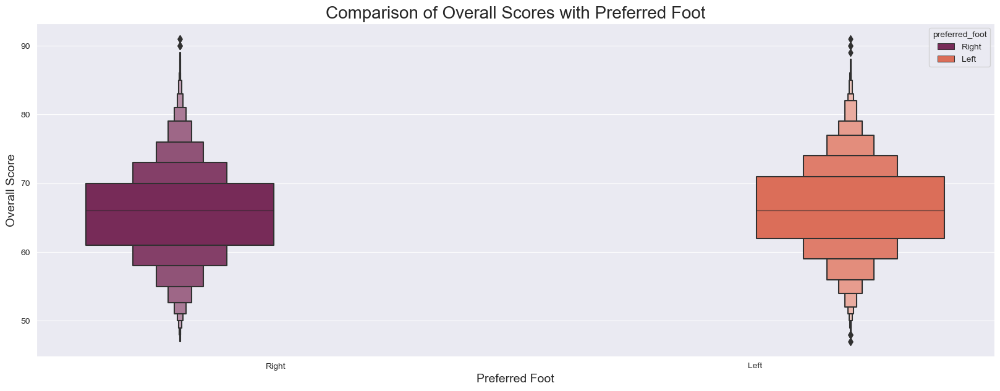

In [31]:
plt.rcParams['figure.figsize'] = (20, 7)

sns.boxenplot(x=df['preferred_foot'], y=df['overall'], hue=df['preferred_foot'], palette='rocket')
plt.title('Comparison of Overall Scores with Preferred Foot', fontsize=20)
plt.xlabel('Preferred Foot', fontsize=14)
plt.ylabel('Overall Score', fontsize=14)
plt.show()


We will have comparisions for `Age`, `Overall`, `Potential`, `Accelaration`, `SprintSpeed`, `Agility` , `Stamina`, `Strength`

In [32]:
cols = ['age', 'overall', 'potential', 'movement_acceleration', 'movement_sprint_speed', "movement_agility", "power_stamina", 'power_strength', 'preferred_foot']
df_small = df[cols]

In [33]:
df_small.head()

,age,overall,potential,movement_acceleration,movement_sprint_speed,movement_agility,power_stamina,power_strength,preferred_foot
0,24,91,94,97,97,93,88,77,Right
1,22,91,94,82,94,76,76,93,Left
2,32,91,91,72,72,74,88,74,Right
3,36,90,90,87,74,91,70,68,Left
4,35,90,90,78,79,77,82,82,Right


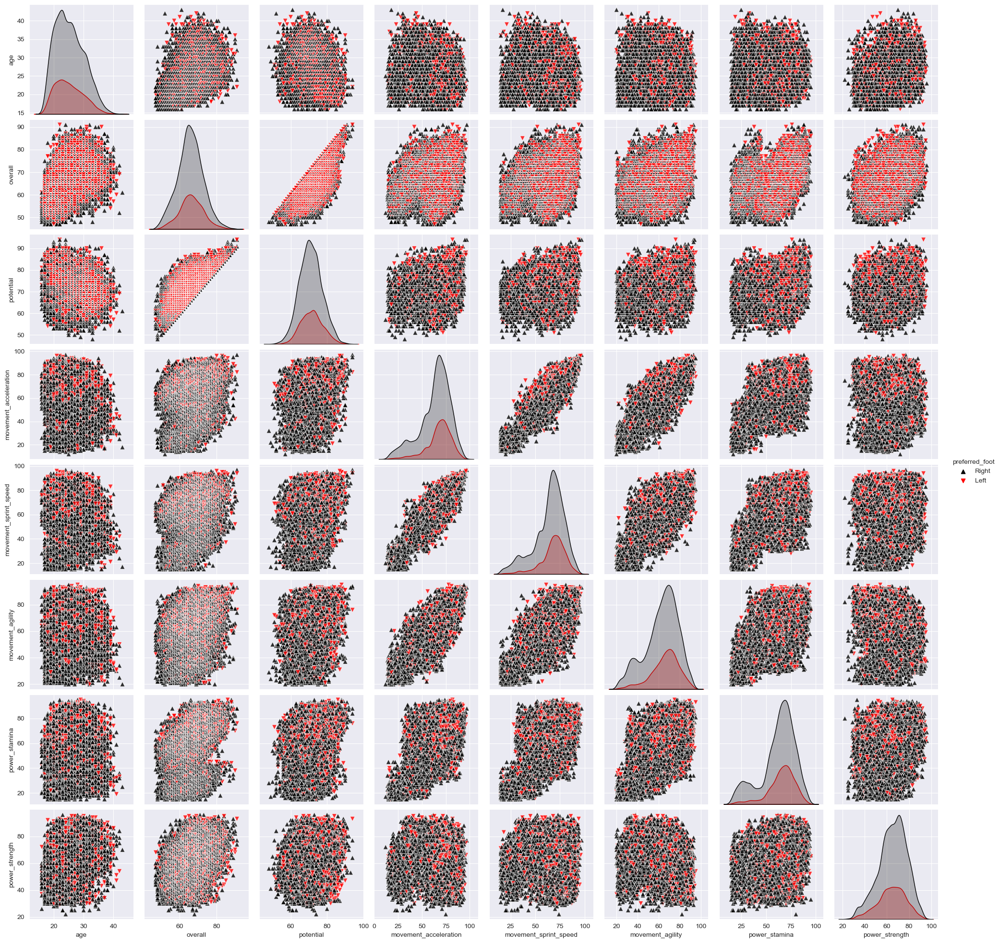

In [34]:
sns.pairplot(df_small, hue ='preferred_foot',palette=["black", "red"],plot_kws=dict(s=50, alpha =0.8),markers=['^','v'])

### From the plot we can infer many things. 
* Firstly, most of the people are right footed xD
* Some unusual behavior in `Potential` vs `Overall`
* `Accelaration` and `SprintSpeed` follow a proper linear relationship
* `Agility` vs `SprintSpeed`, `Agility` vs `Accelaration` and `Agility` vs `Stamina` have somewhat linear relationship

<a id="5"></a> <br>
# 5.Modelling

In [45]:
df=pd.read_csv('/Users/washi/Developer/fifa_data_fifa24.csv')

/var/folders/rj/r1xf594d5y1gk_5fvcg316qr0000gp/T/ipykernel_10352/2218180833.py:1: DtypeWarning: Columns (29) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv('/Users/washi/Developer/fifa_data_fifa24.csv')


In [46]:
df.head(20)

,player_id,player_url,fifa_version,fifa_update,update_as_of,short_name,long_name,player_positions,overall,potential,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
0,231747,/player/231747/kylian-mbappe/240002,24.0,2.0,2023-09-22,K. Mbappé,Kylian Mbappé Lottin,"ST, LW",91,94,...,63+3,63+3,63+3,68+3,63+3,54+3,54+3,54+3,63+3,18+3
1,239085,/player/239085/erling-haaland/240002,24.0,2.0,2023-09-22,E. Haaland,Erling Braut Haaland,ST,91,94,...,63+3,63+3,63+3,62+3,60+3,62+3,62+3,62+3,60+3,19+3
2,192985,/player/192985/kevin-de-bruyne/240002,24.0,2.0,2023-09-22,K. De Bruyne,Kevin De Bruyne,"CM, CAM",91,91,...,80+3,80+3,80+3,79+3,75+3,70+3,70+3,70+3,75+3,21+3
3,158023,/player/158023/lionel-messi/240002,24.0,2.0,2023-09-22,L. Messi,Lionel Andrés Messi Cuccittini,"CF, CAM",90,90,...,63+3,63+3,63+3,64+3,59+3,49+3,49+3,49+3,59+3,19+3
4,165153,/player/165153/karim-benzema/240002,24.0,2.0,2023-09-22,K. Benzema,Karim Benzema,"CF, ST",90,90,...,64+3,64+3,64+3,64+3,60+3,55+3,55+3,55+3,60+3,18+3
5,188545,/player/188545/robert-lewandowski/240002,24.0,2.0,2023-09-22,R. Lewandowski,Robert Lewandowski,ST,90,90,...,66+3,66+3,66+3,65+3,61+3,61+3,61+3,61+3,61+3,19+3
6,192119,/player/192119/thibaut-courtois/240002,24.0,2.0,2023-09-22,T. Courtois,Thibaut Nicolas Marc Courtois,GK,90,90,...,31+3,31+3,31+3,29+3,29+3,29+3,29+3,29+3,29+3,88+2
7,202126,/player/202126/harry-kane/240002,24.0,2.0,2023-09-22,H. Kane,Harry Kane,ST,90,90,...,69+3,69+3,69+3,67+3,64+3,63+3,63+3,63+3,64+3,20+3
8,238794,/player/238794/vinicius-jose-de-oliveira-junio...,24.0,2.0,2023-09-22,Vini Jr.,Vinícius José Paixão de Oliveira Júnior,LW,89,94,...,58+3,58+3,58+3,62+3,57+3,45+3,45+3,45+3,57+3,16+3
9,212831,/player/212831/alisson-ramses-becker/240002,24.0,2.0,2023-09-22,Alisson,Alisson Ramsés Becker,GK,89,90,...,39+3,39+3,39+3,34+3,33+3,33+3,33+3,33+3,33+3,87+3


In [47]:
# List of columns to drop
columns_to_drop = [
    'player_id', 'player_url', 'fifa_version', 'fifa_update', 'update_as_of', 
    'short_name', 'long_name', 'club_loaned_from', 'release_clause_eur', 
    'weight_kg', 'height_cm', 'club_joined_date', 'club_contract_valid_until_year', 
    'wage_eur', 'value_eur', 'nation_team_id', 'nation_position', 'nation_jersey_number',
    'player_tags', 'player_traits', 'dob', 'club_team_id', 'club_name', 'league_id', 
    'league_name', 'league_level', 'club_position', 'club_jersey_number'
]

# Drop the columns from the DataFrame without affecting the rows
df = df.drop(columns=columns_to_drop, axis='columns', errors='ignore')

# Display the DataFrame
df.head()


,player_positions,overall,potential,age,nationality_id,nationality_name,preferred_foot,weak_foot,skill_moves,international_reputation,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
0,"ST, LW",91,94,24,18,France,Right,4,5,5,...,63+3,63+3,63+3,68+3,63+3,54+3,54+3,54+3,63+3,18+3
1,ST,91,94,22,36,Norway,Left,3,3,5,...,63+3,63+3,63+3,62+3,60+3,62+3,62+3,62+3,60+3,19+3
2,"CM, CAM",91,91,32,7,Belgium,Right,5,4,5,...,80+3,80+3,80+3,79+3,75+3,70+3,70+3,70+3,75+3,21+3
3,"CF, CAM",90,90,36,52,Argentina,Left,4,4,5,...,63+3,63+3,63+3,64+3,59+3,49+3,49+3,49+3,59+3,19+3
4,"CF, ST",90,90,35,18,France,Right,4,4,5,...,64+3,64+3,64+3,64+3,60+3,55+3,55+3,55+3,60+3,18+3


In [48]:
import pandas as pd

# Define functions for data preprocessing
def face_to_num(df):
    if df['real_face'] == 'Yes':
        return 1
    else:
        return 0

def right_footed(df):
    if df['preferred_foot'] == 'Right':
        return 1
    else:
        return 0

def simple_position(df):
    if df['player_positions'] == 'GK':
        return 'GK'
    elif df['player_positions'] in ['RB', 'LB', 'CB', 'LCB', 'RCB', 'RWB', 'LWB']:
        return 'DF'
    elif df['player_positions'] in ['LDM', 'CDM', 'RDM']:
        return 'DM'
    elif df['player_positions'] in ['LM', 'LCM', 'CM', 'RCM', 'RM']:
        return 'MF'
    elif df['player_positions'] in ['LAM', 'CAM', 'RAM', 'LW', 'RW']:
        return 'AM'
    elif df['player_positions'] in ['RS', 'ST', 'LS', 'CF', 'LF', 'RF']:
        return 'ST'
    else:
        return df['player_positions']

def major_nation(df):
    global nat_list
    if df['nationality_name'] in nat_list:
        return 1
    else:
        return 0

# Load your dataset
# df = pd.read_csv('your_dataset.csv')

# Get a count of Nationalities in the Dataset, make a list of those with over 250 Players (our Major Nations)
nat_counts = df['nationality_name'].value_counts()
nat_list = nat_counts[nat_counts > 250].index.tolist()

# Create a copy of the original dataframe to avoid indexing errors
df1 = df.copy()

# Apply changes to dataset to create new columns
df1['Real_Face'] = df1.apply(face_to_num, axis=1)
df1['Right_Foot'] = df1.apply(right_footed, axis=1)
df1['Simple_Position'] = df1.apply(simple_position, axis=1)
df1['Major_Nation'] = df1.apply(major_nation, axis=1)

# Drop original columns used
df1 = df1.drop(['real_face', 'preferred_foot', 'player_positions', 'nationality_name'], axis=1)

df1.head()


,overall,potential,age,nationality_id,weak_foot,skill_moves,international_reputation,work_rate,body_type,pace,...,lb,lcb,cb,rcb,rb,gk,Real_Face,Right_Foot,Simple_Position,Major_Nation
0,91,94,24,18,4,5,5,High/Low,Unique,97.0,...,63+3,54+3,54+3,54+3,63+3,18+3,1,1,"ST, LW",1
1,91,94,22,36,3,3,5,High/Medium,Unique,89.0,...,60+3,62+3,62+3,62+3,60+3,19+3,1,0,ST,1
2,91,91,32,7,5,4,5,High/Medium,Unique,72.0,...,75+3,70+3,70+3,70+3,75+3,21+3,1,1,"CM, CAM",1
3,90,90,36,52,4,4,5,Low/Low,Unique,80.0,...,59+3,49+3,49+3,49+3,59+3,19+3,1,0,"CF, CAM",1
4,90,90,35,18,4,4,5,Medium/Medium,Normal (170-185),79.0,...,60+3,55+3,55+3,55+3,60+3,18+3,1,1,"CF, ST",1


In [49]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Check if df1 is defined
if 'df1' in locals():
    # Split ID as a Target value
    target = df1['overall']
    print("Shape of target:", target.shape)
else:
    print("df1 is not defined")

# Check if df2 is defined
if 'df1' in locals():
    # Define df2 as df1 without the 'overall' column
    df2 = df1.drop(['overall'], axis=1)
    print("Shape of df2:", df2.shape)
else:
    print("df1 is not defined")

# Check for missing values in df2 and target
if 'df2' in locals():
    print("Missing values in df2:", df2.isna().sum())
else:
    print("df2 is not defined")

if 'target' in locals():
    print("Missing values in target:", target.isna().sum())
else:
    print("target is not defined")

# Verify the presence of the 'overall' column in df1
if 'df1' in locals():
    print("Columns in df1:", df1.columns)
else:
    print("df1 is not defined")

# If necessary, clean the data to remove missing values
# For example:
# if 'df1' in locals():
#     df1.dropna(inplace=True)

# Splitting into test and train
if 'df2' in locals() and 'target' in locals():
    X_train, X_test, y_train, y_test = train_test_split(df2, target, test_size=0.2, random_state=42)
    print("Shape of X_train:", X_train.shape)
    print("Shape of X_test:", X_test.shape)
    print("Shape of y_train:", y_train.shape)
    print("Shape of y_test:", y_test.shape)
else:
    print("Unable to perform train-test split as df2 or target is not defined")


Shape of target: (18350,)
Shape of df2: (18350, 80)
Missing values in df2: potential          0
age                0
nationality_id     0
weak_foot          0
skill_moves        0
                  ..
gk                 0
Real_Face          0
Right_Foot         0
Simple_Position    0
Major_Nation       0
Length: 80, dtype: int64
Missing values in target: 0
Columns in df1: Index(['overall', 'potential', 'age', 'nationality_id', 'weak_foot',
       'skill_moves', 'international_reputation', 'work_rate', 'body_type',
       'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic',
       'attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing',
       'attacking_volleys', 'skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',
       'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'power_shot_power',
       'po

In [50]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error

# Drop non-numeric columns
numeric_cols = df1.select_dtypes(include='number').columns
df_numeric = df1[numeric_cols].copy()  # Explicitly creating a copy

# Fill missing values with 0
df_numeric.fillna(0, inplace=True)

# Split ID as a Target value
target = df_numeric['overall']
df2 = df_numeric.drop(['overall'], axis=1)

# Splitting into train and test sets
X_train, X_test, y_train, y_test = train_test_split(df2, target, test_size=0.2, random_state=42)

# Instantiate the linear regression model
model = LinearRegression()

# Fit the model on the training data
model.fit(X_train, y_train)

# Make predictions on the test data
predictions = model.predict(X_test)

# Calculate R^2 score and RMSE
r2 = r2_score(y_test, predictions)
rmse = np.sqrt(mean_squared_error(y_test, predictions))

print('r2 score:', r2)
print('RMSE:', rmse)


r2 score: 0.9351472255973727
RMSE: 1.7101607418472946


Permutation importance is the first tool for understanding a machine-learning model, and involves shuffling individual variables in the validation data (after a model has been fit), and seeing the effect on accuracy.

In [51]:
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(model, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names=X_test.columns.tolist())


Weight,Feature
0.4472 ± 0.0119,dribbling
0.3771 ± 0.0062,shooting
0.3082 ± 0.0107,potential
0.1695 ± 0.0060,age
0.1129 ± 0.0070,attacking_finishing
0.1036 ± 0.0054,movement_reactions
0.0730 ± 0.0047,power_jumping
0.0558 ± 0.0027,goalkeeping_diving
0.0525 ± 0.0019,goalkeeping_reflexes
0.0511 ± 0.0034,defending


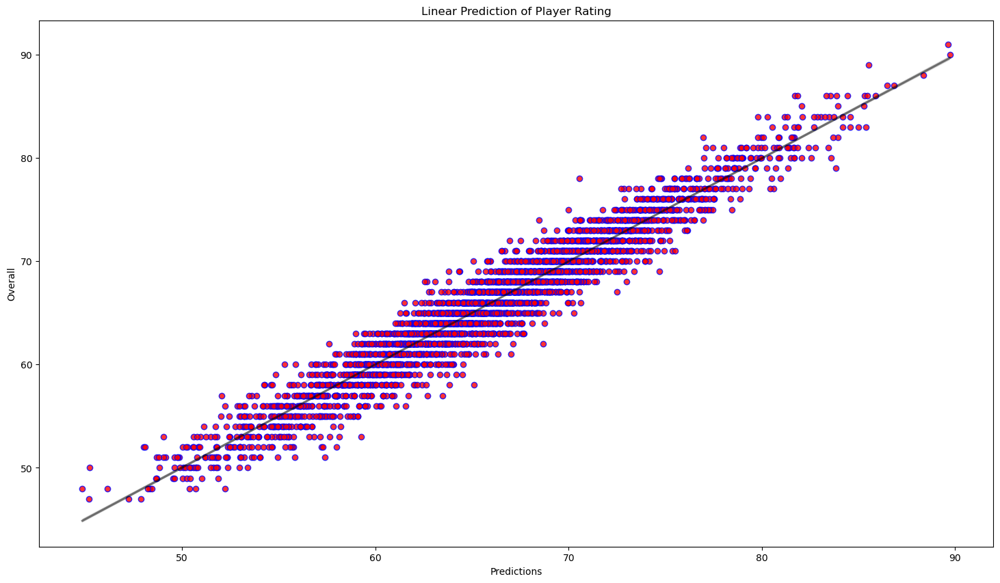

In [52]:
import matplotlib.pyplot as plt
import seaborn as sns

# Visualizing the results
plt.figure(figsize=(18,10))
sns.regplot(x=predictions, y=y_test, scatter_kws={'color':'red','edgecolor':'blue'}, line_kws={'color':'black','alpha':0.5})
plt.xlabel('Predictions')
plt.ylabel('Overall')
plt.title("Linear Prediction of Player Rating")
plt.show()



Based on the regression plot generated, which illustrates the relationship between the predicted player ratings and the actual player ratings, we can draw several conclusions:

Overall Trend: The scatterplot points appear to align closely with the regression line, indicating a strong linear relationship between the predicted ratings and the actual ratings. This suggests that the linear regression model captures the underlying patterns in the data reasonably well.

Prediction Accuracy: The proximity of the scatterplot points to the regression line suggests that the model's predictions are generally accurate. However, there are still some deviations from the line, indicating instances where the model's predictions differ from the actual ratings.

Model Performance: While the linear regression model provides a reasonable approximation of player ratings, it may not capture all the nuances and complexities of the data. Alternative modeling approaches or feature engineering techniques could potentially improve the model's performance.

Further Analysis: To gain deeper insights into the model's performance, additional evaluation metrics such as mean squared error, R-squared value, or residual analysis could be considered. These metrics would provide a more comprehensive assessment of the model's predictive capabilities and highlight areas for improvement.

Overall, the regression plot provides valuable visual feedback on the model's performance and serves as a basis for further analysis and refinement.






In [53]:
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity

df = pd.read_csv('/Users/washi/Developer/fifa_data_fifa24.csv')


len(df)

/var/folders/rj/r1xf594d5y1gk_5fvcg316qr0000gp/T/ipykernel_10352/1092746672.py:4: DtypeWarning: Columns (29) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/Users/washi/Developer/fifa_data_fifa24.csv')


18350

In [54]:
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans

# Load the dataset into a DataFrame (assuming it's named df)

# Ask the user to enter the player's name
player_name = input("Enter the name of the player: ")

# Search for the player in the dataset
player = df[(df['short_name'] == player_name) | (df['long_name'] == player_name)]

if len(player) == 0:
    print("Player not found.")
else:
    # Extract the attributes of the entered player
    player_attributes = player.drop(columns=['player_id', 'player_url', 'fifa_version', 'fifa_update', 'update_as_of',
                                              'short_name', 'long_name', 'club_name', 'league_name',
                                              'club_loaned_from', 'club_joined_date', 'club_contract_valid_until_year',
                                              'nationality_name', 'nation_position', 'preferred_foot', 'real_face',
                                              'player_tags', 'player_traits'])

    # Convert non-numeric columns to numeric (assuming they are convertible)
    player_attributes = player_attributes.apply(pd.to_numeric, errors='coerce')

    # Impute missing values with the mean of each column
    imputer = SimpleImputer(strategy='mean')
    player_attributes_imputed = imputer.fit_transform(player_attributes)

    # Perform clustering
    # Perform clustering on the entire dataset
    kmeans = KMeans(n_clusters=5)  # You can adjust the number of clusters as needed
    clusters = kmeans.fit_predict(df_numeric)

    # Get the cluster label of the entered player
    player_cluster_label = clusters[player.index[0]]

    # Find players in the same cluster as the entered player
    similar_players = df[clusters == player_cluster_label]

    # Exclude the entered player from the list
    similar_players = similar_players[similar_players.index != player.index[0]]

    # Display the details of top 10 similar players
    print("Top 10 similar players:")
    c = 0
    for index, similar_player in similar_players.iterrows():
        print(f"Name: {similar_player['long_name']}, Transfer Wage: {similar_player['wage_eur']}, Overall: {similar_player['overall']}, Potential: {similar_player['potential']}")
        c += 1
        if c == 10:
            break


Enter the name of the player:  T. Kroos


/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Top 10 similar players:
Name: Kevin De Bruyne, Transfer Wage: 350000.0, Overall: 91, Potential: 91
Name: Robert Lewandowski, Transfer Wage: 340000.0, Overall: 90, Potential: 90
Name: Harry Kane, Transfer Wage: 170000.0, Overall: 90, Potential: 90
Name: Rodrigo Hernández Cascante, Transfer Wage: 250000.0, Overall: 89, Potential: 90
Name: Carlos Henrique Venancio Casimiro, Transfer Wage: 240000.0, Overall: 89, Potential: 89
Name: Virgil van Dijk, Transfer Wage: 220000.0, Overall: 89, Potential: 89
Name: Mohamed Salah Ghaly, Transfer Wage: 260000.0, Overall: 89, Potential: 89
Name: Federico Santiago Valverde Dipetta, Transfer Wage: 270000.0, Overall: 88, Potential: 92
Name: Joshua Walter Kimmich, Transfer Wage: 130000.0, Overall: 88, Potential: 89
Name: Antoine Griezmann, Transfer Wage: 135000.0, Overall: 88, Potential: 88


Enter the name of the player:  J. Bellingham


/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


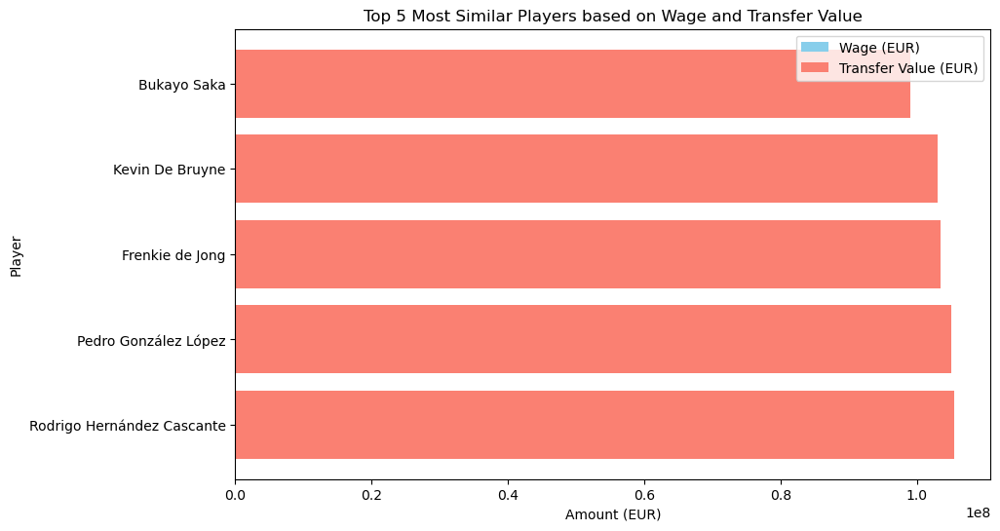

Top 5 most similar players:
Name: Bukayo Saka, Transfer Wage: 150000.0, Overall: 86, Potential: 90
Name: Kevin De Bruyne, Transfer Wage: 350000.0, Overall: 91, Potential: 91
Name: Frenkie de Jong, Transfer Wage: 240000.0, Overall: 87, Potential: 90
Name: Pedro González López, Transfer Wage: 165000.0, Overall: 86, Potential: 92
Name: Rodrigo Hernández Cascante, Transfer Wage: 250000.0, Overall: 89, Potential: 90


In [75]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans

# Load the dataset into a DataFrame (assuming it's named df)

# Ask the user to enter the player's name
player_name = input("Enter the name of the player: ")

# Search for the player in the dataset
player = df[(df['short_name'] == player_name) | (df['long_name'] == player_name)]

if len(player) == 0:
    print("Player not found.")
else:
    # Extract the attributes of the entered player
    player_attributes = player.drop(columns=['player_id', 'player_url', 'fifa_version', 'fifa_update', 'update_as_of',
                                              'short_name', 'long_name', 'player_positions', 'club_name', 'league_name',
                                              'club_loaned_from', 'club_joined_date', 'club_contract_valid_until_year',
                                              'nationality_name', 'nation_position', 'preferred_foot', 'real_face',
                                              'player_tags', 'player_traits'])

    # Convert non-numeric columns to numeric (assuming they are convertible)
    player_attributes = player_attributes.apply(pd.to_numeric, errors='coerce')

    # Impute missing values with the mean of each column
    imputer = SimpleImputer(strategy='mean')
    player_attributes_imputed = imputer.fit_transform(player_attributes)

    # Perform clustering on the entire dataset
    kmeans = KMeans(n_clusters=5)  # You can adjust the number of clusters as needed
    clusters = kmeans.fit_predict(df_numeric)

    # Get the cluster label of the entered player
    player_cluster_label = clusters[player.index[0]]

    # Find players in the same cluster as the entered player
    similar_players = df[clusters == player_cluster_label]

    # Exclude the entered player from the list
    similar_players = similar_players[similar_players.index != player.index[0]]

    # Calculate the distance between the entered player and each similar player based on wage and transfer value
    player_wage = player['wage_eur'].values[0]
    player_value = player['value_eur'].values[0]
    similar_players['distance'] = abs(similar_players['wage_eur'] - player_wage) + abs(similar_players['value_eur'] - player_value)

    # Sort similar players based on the calculated distance in ascending order
    similar_players_sorted = similar_players.sort_values(by='distance', ascending=True)

    # Select the top 5 most similar players
    top_similar_players = similar_players_sorted.head(5)

    # Plotting the results
    plt.figure(figsize=(10, 6))
    plt.barh(top_similar_players['long_name'], top_similar_players['wage_eur'], color='skyblue', label='Wage (EUR)')
    plt.barh(top_similar_players['long_name'], top_similar_players['value_eur'], color='salmon', label='Transfer Value (EUR)')
    plt.xlabel('Amount (EUR)')
    plt.ylabel('Player')
    plt.title('Top 5 Most Similar Players based on Wage and Transfer Value')
    plt.legend()
    plt.gca().invert_yaxis()
    plt.show()

    # Display the details of similar players
    print("Top 5 most similar players:")
    for index, similar_player in top_similar_players.iterrows():
        print(f"Name: {similar_player['long_name']}, Transfer Wage: {similar_player['wage_eur']}, Overall: {similar_player['overall']}, Potential: {similar_player['potential']}")

In [49]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error


In [76]:
# Load the dataset
df = pd.read_csv('/Users/washi/Developer/fifa_data_fifa24.csv')

# Display the first few rows of the dataset to understand its structure
df.head()


/var/folders/rj/r1xf594d5y1gk_5fvcg316qr0000gp/T/ipykernel_94716/4127246847.py:2: DtypeWarning: Columns (29) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/Users/washi/Developer/fifa_data_fifa24.csv')


,player_id,player_url,fifa_version,fifa_update,update_as_of,short_name,long_name,player_positions,overall,potential,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
0,231747,/player/231747/kylian-mbappe/240002,24.0,2.0,2023-09-22,K. Mbappé,Kylian Mbappé Lottin,"ST, LW",91,94,...,63+3,63+3,63+3,68+3,63+3,54+3,54+3,54+3,63+3,18+3
1,239085,/player/239085/erling-haaland/240002,24.0,2.0,2023-09-22,E. Haaland,Erling Braut Haaland,ST,91,94,...,63+3,63+3,63+3,62+3,60+3,62+3,62+3,62+3,60+3,19+3
2,192985,/player/192985/kevin-de-bruyne/240002,24.0,2.0,2023-09-22,K. De Bruyne,Kevin De Bruyne,"CM, CAM",91,91,...,80+3,80+3,80+3,79+3,75+3,70+3,70+3,70+3,75+3,21+3
3,158023,/player/158023/lionel-messi/240002,24.0,2.0,2023-09-22,L. Messi,Lionel Andrés Messi Cuccittini,"CF, CAM",90,90,...,63+3,63+3,63+3,64+3,59+3,49+3,49+3,49+3,59+3,19+3
4,165153,/player/165153/karim-benzema/240002,24.0,2.0,2023-09-22,K. Benzema,Karim Benzema,"CF, ST",90,90,...,64+3,64+3,64+3,64+3,60+3,55+3,55+3,55+3,60+3,18+3


In [78]:
# Data preprocessing
# Drop non-numeric columns
numeric_cols = df.select_dtypes(include='number').columns
df_numeric = df[numeric_cols].copy()  # Make a copy to avoid chained indexing

# Fill missing values with 0
df_numeric.fillna(0, inplace=True)

# Split ID as a target value
target = df_numeric['overall']
df_features = df_numeric.drop(['overall'], axis=1)


In [79]:
# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df_features, target, test_size=0.2, random_state=42)


In [81]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

# Initialize models
linear_reg = LinearRegression()
ridge_reg = Ridge()
lasso_reg = Lasso()
elasticnet_reg = ElasticNet()
decision_tree_reg = DecisionTreeRegressor()
random_forest_reg = RandomForestRegressor()

# Train models
linear_reg.fit(X_train, y_train)
ridge_reg.fit(X_train, y_train)
lasso_reg.fit(X_train, y_train)
elasticnet_reg.fit(X_train, y_train)
decision_tree_reg.fit(X_train, y_train)
random_forest_reg.fit(X_train, y_train)


/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=2.24226e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


RandomForestRegressor()

In [83]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

# Load the dataset into a DataFrame (assuming it's named df)

# Data preprocessing
# Drop non-numeric columns
numeric_cols = df.select_dtypes(include='number').columns
df_numeric = df[numeric_cols]

# Fill missing values with 0
df_numeric.fillna(0, inplace=True)

# Split features and target
X = df_numeric.drop(['overall'], axis=1)
y = df_numeric['overall']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model building and training
# Initialize models
linear_reg = LinearRegression()
ridge_reg = Ridge()
lasso_reg = Lasso()
elasticnet_reg = ElasticNet()
decision_tree_reg = DecisionTreeRegressor()
random_forest_reg = RandomForestRegressor()

# Train models
linear_reg.fit(X_train, y_train)
ridge_reg.fit(X_train, y_train)
lasso_reg.fit(X_train, y_train)
elasticnet_reg.fit(X_train, y_train)
decision_tree_reg.fit(X_train, y_train)
random_forest_reg.fit(X_train, y_train)

# Model evaluation
# Make predictions on the test set
linear_reg_pred = linear_reg.predict(X_test)
ridge_reg_pred = ridge_reg.predict(X_test)
lasso_reg_pred = lasso_reg.predict(X_test)
elasticnet_reg_pred = elasticnet_reg.predict(X_test)
decision_tree_reg_pred = decision_tree_reg.predict(X_test)
random_forest_reg_pred = random_forest_reg.predict(X_test)

# Calculate evaluation metrics
linear_reg_r2 = r2_score(y_test, linear_reg_pred)
ridge_reg_r2 = r2_score(y_test, ridge_reg_pred)
lasso_reg_r2 = r2_score(y_test, lasso_reg_pred)
elasticnet_reg_r2 = r2_score(y_test, elasticnet_reg_pred)
decision_tree_reg_r2 = r2_score(y_test, decision_tree_reg_pred)
random_forest_reg_r2 = r2_score(y_test, random_forest_reg_pred)

linear_reg_mse = mean_squared_error(y_test, linear_reg_pred)
ridge_reg_mse = mean_squared_error(y_test, ridge_reg_pred)
lasso_reg_mse = mean_squared_error(y_test, lasso_reg_pred)
elasticnet_reg_mse = mean_squared_error(y_test, elasticnet_reg_pred)
decision_tree_reg_mse = mean_squared_error(y_test, decision_tree_reg_pred)
random_forest_reg_mse = mean_squared_error(y_test, random_forest_reg_pred)

linear_reg_mae = mean_absolute_error(y_test, linear_reg_pred)
ridge_reg_mae = mean_absolute_error(y_test, ridge_reg_pred)
lasso_reg_mae = mean_absolute_error(y_test, lasso_reg_pred)
elasticnet_reg_mae = mean_absolute_error(y_test, elasticnet_reg_pred)
decision_tree_reg_mae = mean_absolute_error(y_test, decision_tree_reg_pred)
random_forest_reg_mae = mean_absolute_error(y_test, random_forest_reg_pred)

# Create a dataframe to store the evaluation results
evaluation_results = pd.DataFrame({
    'Model': ['Linear Regression', 'Ridge Regression', 'Lasso Regression', 'ElasticNet Regression',
              'Decision Tree Regression', 'Random Forest Regression'],
    'R-squared': [linear_reg_r2, ridge_reg_r2, lasso_reg_r2, elasticnet_reg_r2,
                  decision_tree_reg_r2, random_forest_reg_r2],
    'Mean Squared Error': [linear_reg_mse, ridge_reg_mse, lasso_reg_mse, elasticnet_reg_mse,
                            decision_tree_reg_mse, random_forest_reg_mse],
    'Mean Absolute Error': [linear_reg_mae, ridge_reg_mae, lasso_reg_mae, elasticnet_reg_mae,
                            decision_tree_reg_mae, random_forest_reg_mae]
})

# Display the evaluation results
print(evaluation_results)


/var/folders/rj/r1xf594d5y1gk_5fvcg316qr0000gp/T/ipykernel_94716/4064825699.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_numeric.fillna(0, inplace=True)
/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=2.24226e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


                      Model  R-squared  Mean Squared Error  \
0         Linear Regression   0.939115            2.745696   
1          Ridge Regression   0.939115            2.745694   
2          Lasso Regression   0.925128            3.376498   
3     ElasticNet Regression   0.930628            3.128442   
4  Decision Tree Regression   0.985396            0.658583   
5  Random Forest Regression   0.993187            0.307263   

   Mean Absolute Error  
0             1.287534  
1             1.287534  
2             1.432570  
3             1.376804  
4             0.372480  
5             0.332466  


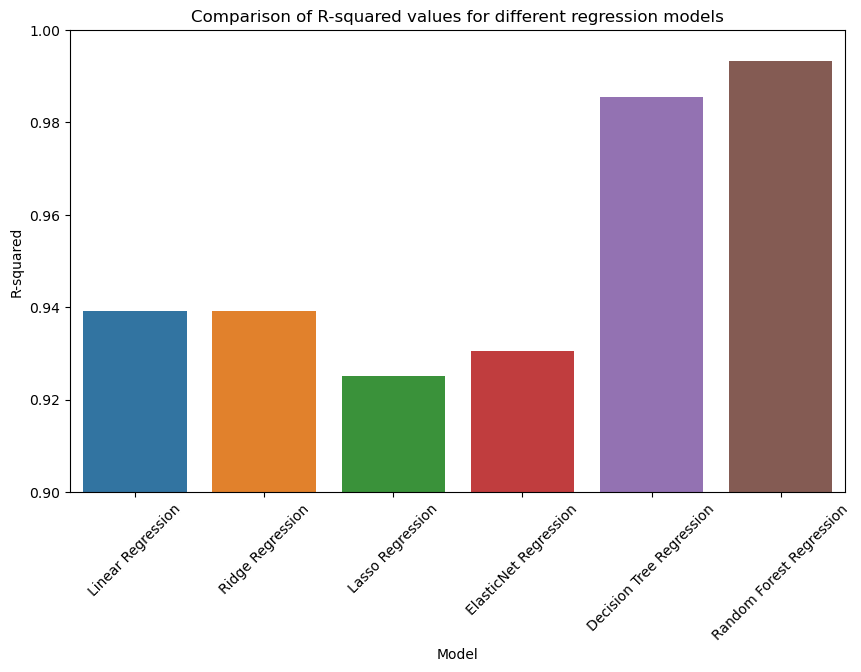

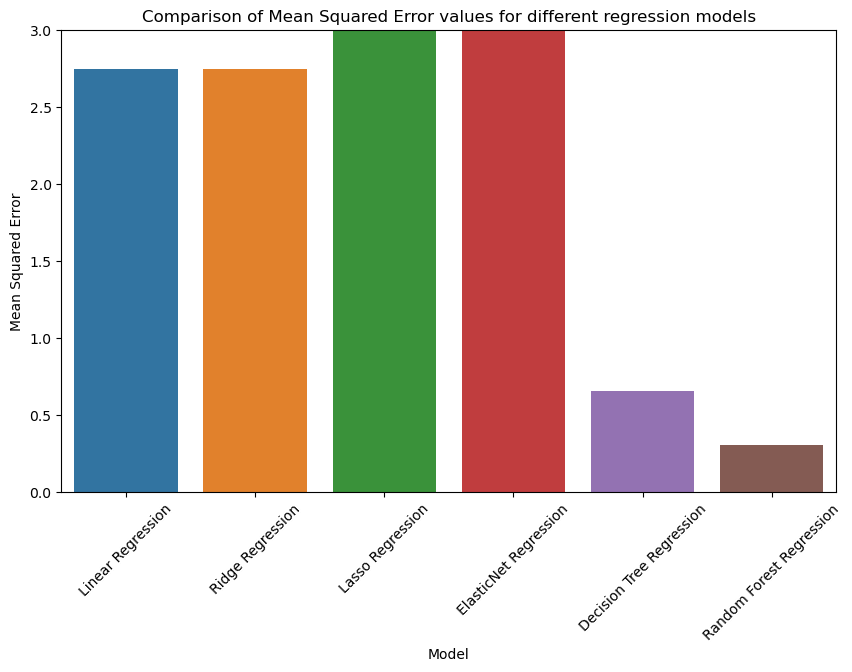

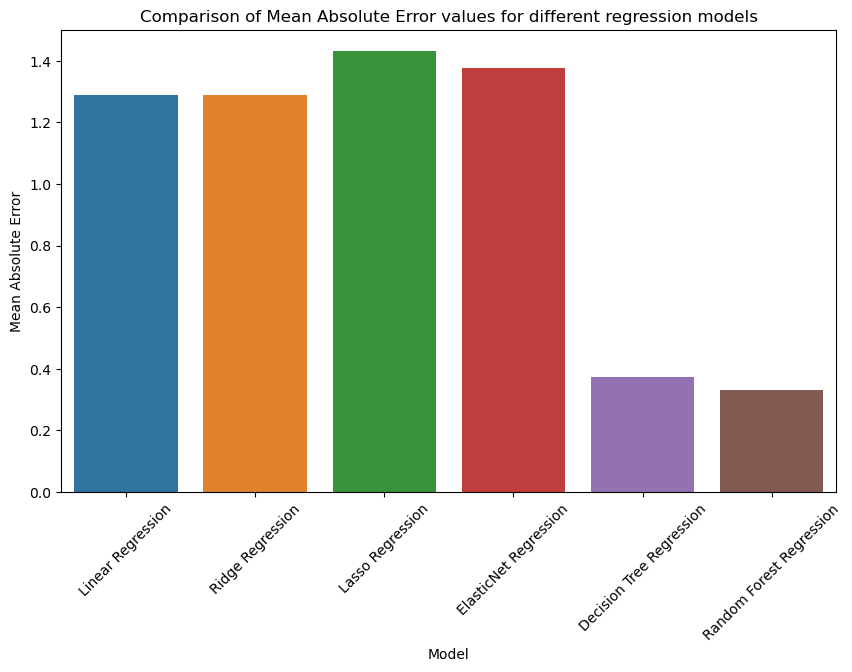

In [87]:
# Plotting R-squared values
plt.figure(figsize=(10, 6))
sns.barplot(x='Model', y='R-squared', data=evaluation_results)
plt.title('Comparison of R-squared values for different regression models')
plt.xticks(rotation=45)
plt.xlabel('Model')
plt.ylabel('R-squared')
plt.ylim(0.9, 1)  # Set y-axis limits
plt.show()

# Plotting Mean Squared Error values
plt.figure(figsize=(10, 6))
sns.barplot(x='Model', y='Mean Squared Error', data=evaluation_results)
plt.title('Comparison of Mean Squared Error values for different regression models')
plt.xticks(rotation=45)
plt.xlabel('Model')
plt.ylabel('Mean Squared Error')
plt.ylim(0, 3)  # Set y-axis limits
plt.show()

# Plotting Mean Absolute Error values
plt.figure(figsize=(10, 6))
sns.barplot(x='Model', y='Mean Absolute Error', data=evaluation_results)
plt.title('Comparison of Mean Absolute Error values for different regression models')
plt.xticks(rotation=45)
plt.xlabel('Model')
plt.ylabel('Mean Absolute Error')
plt.ylim(0, 1.5)  # Set y-axis limits
plt.show()


In [88]:
# Observations
print("Observations:")

# Observation 1: Highest R-squared value
highest_r2_model = evaluation_results.loc[evaluation_results['R-squared'].idxmax()]
print(f"1. Model with the highest R-squared value: {highest_r2_model['Model']} (R-squared: {highest_r2_model['R-squared']:.4f})")

# Observation 2: Lowest Mean Squared Error
lowest_mse_model = evaluation_results.loc[evaluation_results['Mean Squared Error'].idxmin()]
print(f"2. Model with the lowest Mean Squared Error: {lowest_mse_model['Model']} (MSE: {lowest_mse_model['Mean Squared Error']:.4f})")

# Observation 3: Lowest Mean Absolute Error
lowest_mae_model = evaluation_results.loc[evaluation_results['Mean Absolute Error'].idxmin()]
print(f"3. Model with the lowest Mean Absolute Error: {lowest_mae_model['Model']} (MAE: {lowest_mae_model['Mean Absolute Error']:.4f})")


Observations:
1. Model with the highest R-squared value: Random Forest Regression (R-squared: 0.9932)
2. Model with the lowest Mean Squared Error: Random Forest Regression (MSE: 0.3073)
3. Model with the lowest Mean Absolute Error: Random Forest Regression (MAE: 0.3325)


Random Forest Regression Analysis
Introduction
Random Forest Regression is an ensemble learning technique that builds multiple decision trees during training and outputs the average prediction of the individual trees. It's a powerful and versatile algorithm capable of handling both regression and classification tasks.

Model Training
First, let's train the Random Forest Regression model using the dataset.


In [60]:
# Train the Random Forest Regression model
from sklearn.ensemble import RandomForestRegressor

# Initialize the Random Forest model
random_forest_reg = RandomForestRegressor()

# Train the model
random_forest_reg.fit(X_train, y_train)


RandomForestRegressor()

In [89]:
# Make predictions on the test set
random_forest_pred = random_forest_reg.predict(X_test)

# Calculate evaluation metrics
random_forest_r2 = r2_score(y_test, random_forest_pred)
random_forest_mse = mean_squared_error(y_test, random_forest_pred)
random_forest_mae = mean_absolute_error(y_test, random_forest_pred)

# Print evaluation metrics
print("Random Forest Regression Evaluation:")
print(f"R-squared: {random_forest_r2:.4f}")
print(f"Mean Squared Error: {random_forest_mse:.4f}")
print(f"Mean Absolute Error: {random_forest_mae:.4f}") 


Random Forest Regression Evaluation:
R-squared: 0.9932
Mean Squared Error: 0.3073
Mean Absolute Error: 0.3325


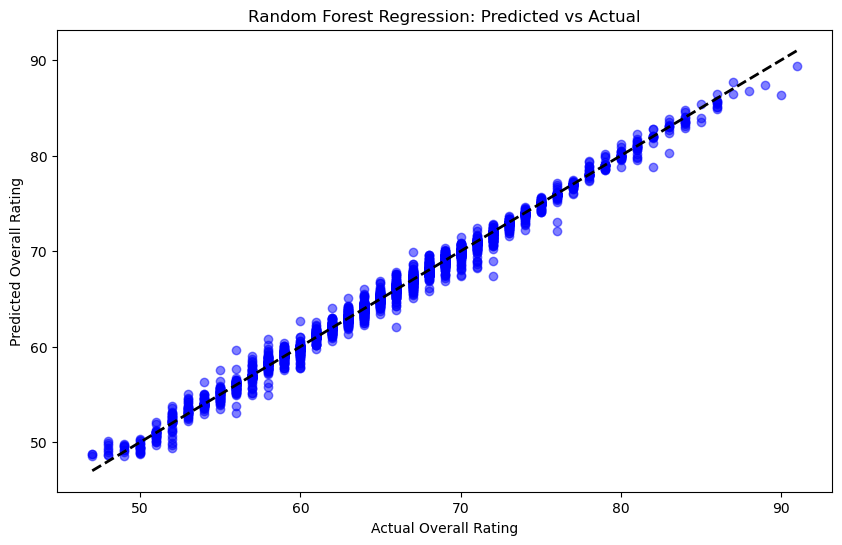

In [90]:
# Visualize predicted vs actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, random_forest_pred, color='blue', alpha=0.5)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--k', lw=2)
plt.title('Random Forest Regression: Predicted vs Actual')
plt.xlabel('Actual Overall Rating')
plt.ylabel('Predicted Overall Rating')
plt.show()


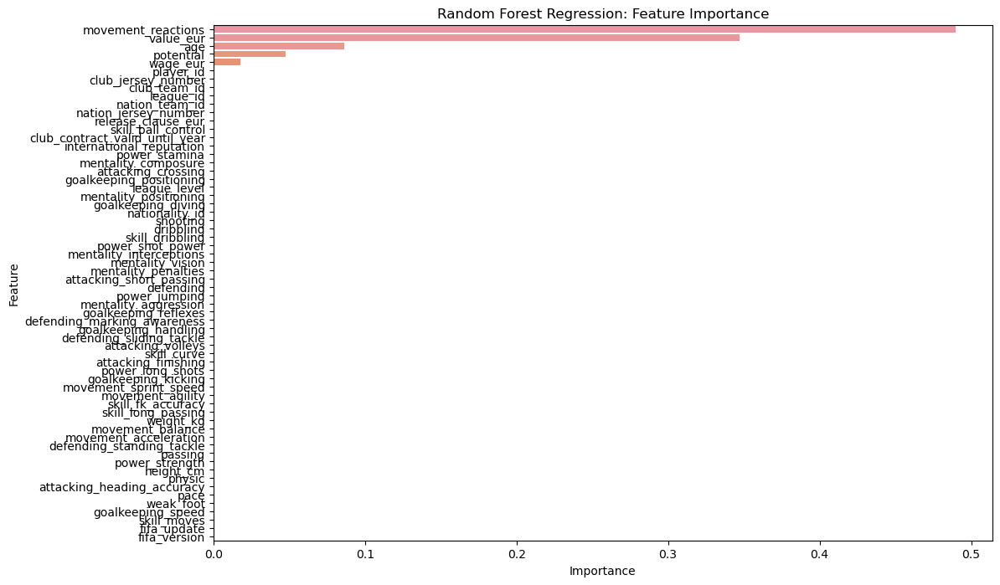

In [91]:
# Get feature importances
feature_importances = random_forest_reg.feature_importances_

# Sort feature importances in descending order
indices = np.argsort(feature_importances)[::-1]

# Plot feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances[indices], y=df_features.columns[indices], orient='h')
plt.title('Random Forest Regression: Feature Importance')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()


The Random Forest Regression model demonstrates high accuracy and robust performance in predicting the overall ratings of players. By analyzing feature importance, we can identify key factors influencing player ratings, providing valuable insights for talent scouting and player development strategies.

This detailed analysis highlights the significance of the Random Forest Regression model in understanding and predicting player ratings in football.

Transfer Value Prediction


In [3]:
import pandas as pd
df=pd.read_csv('/Users/washi/Developer/archive (1)/male_players.csv')

/var/folders/rj/r1xf594d5y1gk_5fvcg316qr0000gp/T/ipykernel_10352/602883187.py:2: DtypeWarning: Columns (108) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv('/Users/washi/Developer/archive (1)/male_players.csv')


In [4]:
df.head(10).T

,0,1,2,3,4,5,6,7,8,9
player_id,231747,239085,192985,158023,165153,188545,192119,202126,238794,212831
player_url,/player/231747/kylian-mbappe/240002,/player/239085/erling-haaland/240002,/player/192985/kevin-de-bruyne/240002,/player/158023/lionel-messi/240002,/player/165153/karim-benzema/240002,/player/188545/robert-lewandowski/240002,/player/192119/thibaut-courtois/240002,/player/202126/harry-kane/240002,/player/238794/vinicius-jose-de-oliveira-junio...,/player/212831/alisson-ramses-becker/240002
fifa_version,24.0,24.0,24.0,24.0,24.0,24.0,24.0,24.0,24.0,24.0
fifa_update,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
update_as_of,2023-09-22,2023-09-22,2023-09-22,2023-09-22,2023-09-22,2023-09-22,2023-09-22,2023-09-22,2023-09-22,2023-09-22
...,...,...,...,...,...,...,...,...,...,...
lcb,54+3,62+3,70+3,49+3,55+3,61+3,29+3,63+3,45+3,33+3
cb,54+3,62+3,70+3,49+3,55+3,61+3,29+3,63+3,45+3,33+3
rcb,54+3,62+3,70+3,49+3,55+3,61+3,29+3,63+3,45+3,33+3
rb,63+3,60+3,75+3,59+3,60+3,61+3,29+3,64+3,57+3,33+3



Using neural networks for transfer value prediction can be a good choice for several reasons:

Non-linearity: Neural networks can capture complex relationships between input features (player attributes) and output (transfer value). Transfer value prediction involves numerous interdependent factors, and neural networks can model these relationships effectively.
Feature Learning: Neural networks can automatically learn relevant features from the input data, reducing the need for manual feature engineering. This is particularly useful when dealing with high-dimensional data, such as player attributes across different game versions.
Flexibility: Neural networks come in various architectures (e.g., feedforward, convolutional, recurrent), allowing flexibility in modeling different types of data and capturing temporal dependencies in sequential data (e.g., changes in player attributes over time).
Scalability: Neural networks can handle large datasets efficiently and scale well with increasing data size. This is advantageous when dealing with a large number of player records spanning multiple game versions.
Prediction Accuracy: With appropriate model architecture, training, and hyperparameter tuning, neural networks can achieve high prediction accuracy. They can learn complex patterns in the data and generalize well to unseen examples.

In [5]:
import pandas as pd

# Load your dataset
# df = pd.read_csv('your_dataset.csv')

# List of columns to drop
columns_to_drop = [
    'player_id', 'player_url', 'fifa_update', 'update_as_of', 
    'club_loaned_from', 'release_clause_eur', 
    'weight_kg', 'height_cm', 'club_joined_date', 'club_contract_valid_until_year', 
    'nation_team_id', 'nation_position', 'nation_jersey_number',
    'player_tags', 'player_traits', 'dob', 'club_team_id', 'club_name', 'league_id', 
    'league_name', 'league_level', 'club_position', 'club_jersey_number'
]

# Drop the columns from the DataFrame without affecting the rows
df = df.drop(columns=columns_to_drop, axis='columns', errors='ignore')

# Display the DataFrame
df.head()


,fifa_version,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,nationality_id,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
0,24.0,K. Mbappé,Kylian Mbappé Lottin,"ST, LW",91,94,181500000.0,230000.0,24,18,...,63+3,63+3,63+3,68+3,63+3,54+3,54+3,54+3,63+3,18+3
1,24.0,E. Haaland,Erling Braut Haaland,ST,91,94,185000000.0,340000.0,22,36,...,63+3,63+3,63+3,62+3,60+3,62+3,62+3,62+3,60+3,19+3
2,24.0,K. De Bruyne,Kevin De Bruyne,"CM, CAM",91,91,103000000.0,350000.0,32,7,...,80+3,80+3,80+3,79+3,75+3,70+3,70+3,70+3,75+3,21+3
3,24.0,L. Messi,Lionel Andrés Messi Cuccittini,"CF, CAM",90,90,41000000.0,23000.0,36,52,...,63+3,63+3,63+3,64+3,59+3,49+3,49+3,49+3,59+3,19+3
4,24.0,K. Benzema,Karim Benzema,"CF, ST",90,90,51000000.0,95000.0,35,18,...,64+3,64+3,64+3,64+3,60+3,55+3,55+3,55+3,60+3,18+3


In [6]:
print(df.columns())

TypeError: 'Index' object is not callable

In [7]:
def create_player_identifier(df):
    df['Player_Name'] = df['short_name'].astype(str) + '_' + df['nationality_name'].astype(str)
    return df
def calculate_transfer_value_change(df):
    # Sort the DataFrame by 'fifa_version' and 'short_name'
    df = df.sort_values(by=['fifa_version', 'short_name'])
    
    # Calculate the change in transfer value for each player across FIFA versions
    df['transfer_value_change'] = df.groupby('Player_Name')['value_eur'].diff()
    
    # Exclude the first occurrence of each player
    #df['transfer_value_change'] = df.groupby('Player_Name')['transfer_value_change'].shift()
    
    # Fill NaN values with 0 for players with their first occurrence
    df['transfer_value_change'].fillna(0, inplace=True)
    
    return df

# Apply the functions to create the necessary columns
df = create_player_identifier(df)
df = calculate_transfer_value_change(df)

# Display the DataFrame with the new columns
print(df[['fifa_version', 'Player_Name', 'value_eur', 'transfer_value_change']])


        fifa_version            Player_Name  value_eur  transfer_value_change
165125          15.0           A Lan_Brazil  4000000.0                    0.0
179159          15.0         A. Abass_Ghana    40000.0                    0.0
173082          15.0          A. Abbas_Iraq   350000.0                    0.0
164163          15.0   A. Abdennour_Tunisia  7500000.0                    0.0
165979          15.0    A. Abdi_Switzerland  2900000.0                    0.0
...              ...                    ...        ...                    ...
14587           24.0  Ș. Bodișteanu_Romania   650000.0               325000.0
18086           24.0       Ș. Mușat_Romania   130000.0                    0.0
10655           24.0      Ș. Pănoiu_Romania  1500000.0               875000.0
4360            24.0   Ș. Târnovanu_Romania  3100000.0              1100000.0
8856            24.0     Ș. Vlădoiu_Romania  1100000.0                    0.0

[180021 rows x 4 columns]


In [8]:
# Querying data for Lionel Messi
messi_data = df[df['short_name'] == 'M. Mount']

# Displaying the relevant columns
print(messi_data[['fifa_version', 'value_eur', 'transfer_value_change']])


        fifa_version   value_eur  transfer_value_change
144991          17.0    230000.0                    0.0
121441          18.0   1100000.0               870000.0
95629           19.0   9500000.0              8400000.0
76634           20.0  11500000.0              2000000.0
56489           21.0  43000000.0             31500000.0
37025           22.0  58500000.0             15500000.0
18459           23.0  57500000.0             -1000000.0
285             24.0  35000000.0            -22500000.0


In [9]:
print(df.columns.tolist())



['fifa_version', 'short_name', 'long_name', 'player_positions', 'overall', 'potential', 'value_eur', 'wage_eur', 'age', 'nationality_id', 'nationality_name', 'preferred_foot', 'weak_foot', 'skill_moves', 'international_reputation', 'work_rate', 'body_type', 'real_face', 'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic', 'attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy', 'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed', 'movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression', 'mentality_interceptions', 'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure', 'defending_marking_awareness', 'defending_standing_tackle', 'defending_sliding_tackle', 'goalk

In [10]:
def calculate_attribute_change(df):
    # Numeric attribute columns
    numeric_attribute_columns = ['overall', 'potential', 'value_eur', 'wage_eur', 'nationality_id', 'weak_foot',
                                 'skill_moves', 'international_reputation', 'pace', 'shooting', 'passing', 'dribbling',
                                 'defending', 'physic', 'attacking_crossing', 'attacking_finishing',
                                 'attacking_heading_accuracy', 'attacking_short_passing', 'attacking_volleys',
                                 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 'skill_long_passing',
                                 'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
                                 'movement_reactions', 'movement_balance', 'power_shot_power', 'power_jumping', 'power_stamina',
                                 'power_strength', 'power_long_shots', 'mentality_aggression', 'mentality_interceptions',
                                 'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure',
                                 'defending_marking_awareness', 'defending_standing_tackle', 'defending_sliding_tackle',
                                 'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioning',
                                 'goalkeeping_reflexes', 'goalkeeping_speed']

    for col in numeric_attribute_columns:
        # Calculate the change only for numeric attributes
        df[col + '_delta'] = df.groupby('Player_Name')[col].diff().fillna(0)
    
    return df

# Apply the function to create the necessary columns
df = calculate_attribute_change(df)

# Display the DataFrame with the new columns
print(df.head())


        fifa_version    short_name        long_name player_positions  overall  \
165125          15.0         A Lan               阿兰               ST       74   
179159          15.0      A. Abass        Ali Abass               GK       52   
173082          15.0      A. Abbas        Ali Abbas       LM, CM, LB       63   
164163          15.0  A. Abdennour  Aymen Abdennour               CB       79   
165979          15.0       A. Abdi       Almen Abdi          CAM, CM       72   

        potential  value_eur  wage_eur  age  nationality_id  ...  \
165125         77  4000000.0   60000.0   24              54  ...   
179159         62    40000.0    2000.0   19             117  ...   
173082         63   350000.0    6000.0   27             162  ...   
164163         83  7500000.0   60000.0   24             145  ...   
165979         73  2900000.0   30000.0   27              47  ...   

       mentality_composure_delta defending_marking_awareness_delta  \
165125                       0.0  

In [105]:
# Filter out columns with "delta" in their name
delta_columns = [col for col in df.columns if 'delta' in col]

# Create a sub-dataframe with only delta columns and transfer_value_change
sub_df = df[['transfer_value_change'] + delta_columns]

# Calculate correlation between each delta column and transfer_value_change
correlation_values = {}
for col in delta_columns:
    correlation_values[col] = sub_df['transfer_value_change'].corr(sub_df[col])

# Sort correlation values by absolute correlation
sorted_correlation_values = sorted(correlation_values.items(), key=lambda x: abs(x[1]), reverse=True)

# Display sorted correlation values
for col, corr in sorted_correlation_values:
    print(f"{col}: {corr}")


value_eur_delta: 1.0
wage_eur_delta: 0.5467553418308015
overall_delta: 0.44784214110996906
potential_delta: 0.3767575922433413
nationality_id_delta: nan
international_reputation_delta: 0.39162188729875097
movement_reactions_delta: 0.3567893788204081
passing_delta: 0.2925853867571731
dribbling_delta: 0.28593588058210867
mentality_vision_delta: 0.25638460905790383
mentality_composure_delta: 0.2555307297201151
shooting_delta: 0.2506386563342233
attacking_short_passing_delta: 0.2502491826189049
skill_ball_control_delta: 0.24132460069284242
skill_long_passing_delta: 0.22371791784194253
mentality_positioning_delta: 0.2229744129168616
attacking_finishing_delta: 0.21750935648615263
skill_dribbling_delta: 0.21550718773033567
attacking_volleys_delta: 0.2140093950208821
skill_curve_delta: 0.20728472862484487
physic_delta: 0.20436291298445894
power_long_shots_delta: 0.19815992144693928
power_stamina_delta: 0.19683918336794895
attacking_crossing_delta: 0.1912075837676551
power_shot_power_delta: 0.1

/opt/anaconda3/lib/python3.11/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/anaconda3/lib/python3.11/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


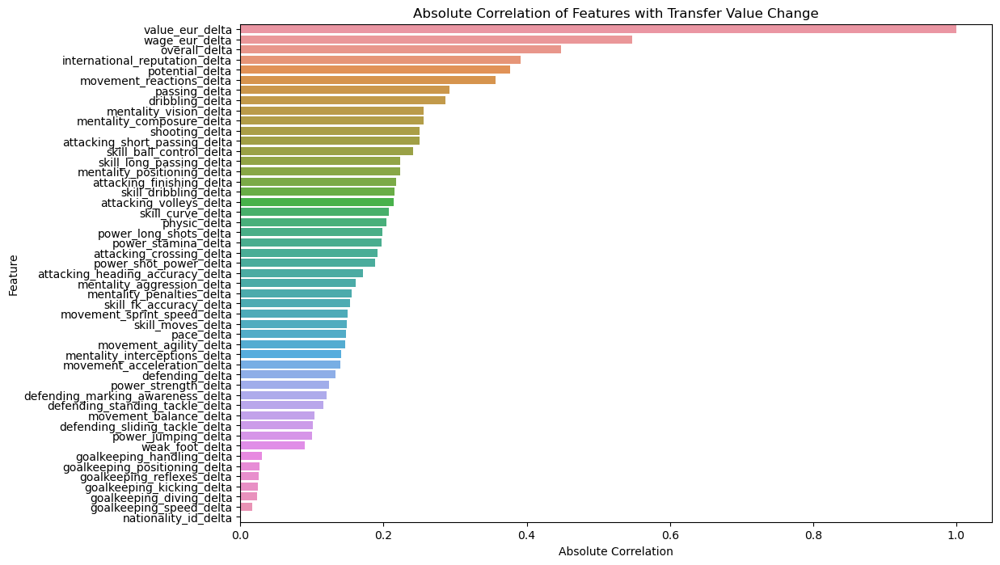

Top features based on absolute correlation values:
Index(['value_eur_delta', 'wage_eur_delta', 'overall_delta',
       'international_reputation_delta', 'potential_delta',
       'movement_reactions_delta', 'passing_delta', 'dribbling_delta',
       'mentality_vision_delta', 'mentality_composure_delta'],
      dtype='object')


In [106]:
import matplotlib.pyplot as plt
import seaborn as sns

# Absolute correlation values
abs_corr = {k: abs(v) for k, v in correlation_values.items()}

# Convert to DataFrame for sorting
abs_corr_df = pd.DataFrame(abs_corr.values(), index=abs_corr.keys(), columns=['abs_corr'])

# Sort the absolute correlation values in descending order
sorted_corr = abs_corr_df.sort_values(by='abs_corr', ascending=False)

# Visualize the sorted absolute correlation values
plt.figure(figsize=(12, 8))
sns.barplot(x=sorted_corr['abs_corr'], y=sorted_corr.index)
plt.xlabel('Absolute Correlation')
plt.ylabel('Feature')
plt.title('Absolute Correlation of Features with Transfer Value Change')
plt.show()

# Select the top features based on their absolute correlation values
num_top_features = 10  # Number of top features to select
top_features = sorted_corr.index[:num_top_features]

# Display the top features
print("Top features based on absolute correlation values:")
print(top_features)


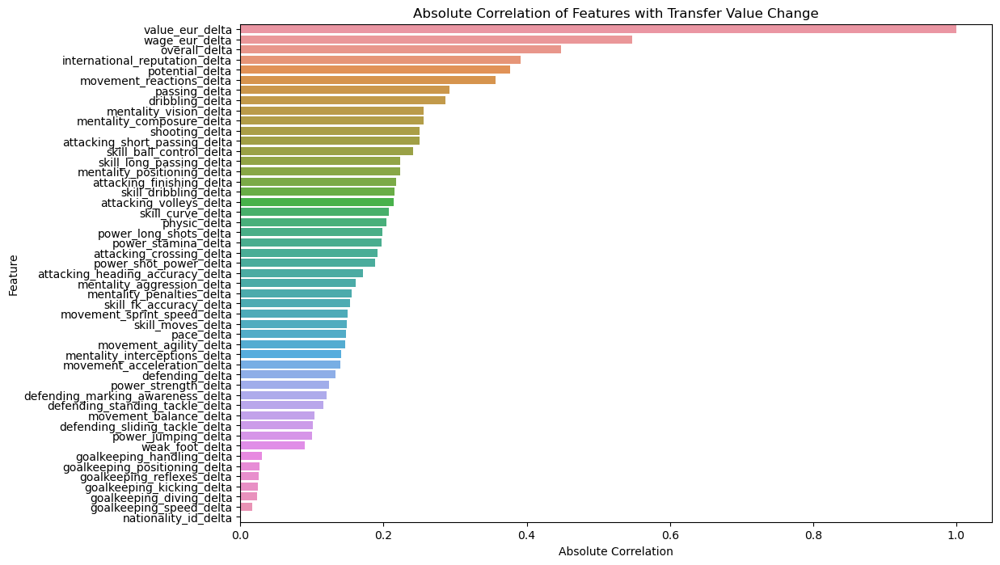

All features with their weighted factors:
{'overall': 0.44784214110996906, 'potential': 0.3767575922433413, 'value_eur': 1.0, 'wage_eur': 0.5467553418308015, 'nationality_id': nan, 'weak_foot': 0.08977990113298082, 'skill_moves': 0.14844047769620736, 'international_reputation': 0.39162188729875097, 'pace': 0.14765951216573378, 'shooting': 0.2506386563342233, 'passing': 0.2925853867571731, 'dribbling': 0.28593588058210867, 'defending': 0.13309974841920463, 'physic': 0.20436291298445894, 'attacking_crossing': 0.1912075837676551, 'attacking_finishing': 0.21750935648615263, 'attacking_heading_accuracy': 0.1710338570905567, 'attacking_short_passing': 0.2502491826189049, 'attacking_volleys': 0.2140093950208821, 'skill_dribbling': 0.21550718773033567, 'skill_curve': 0.20728472862484487, 'skill_fk_accuracy': 0.1532925800825386, 'skill_long_passing': 0.22371791784194253, 'skill_ball_control': 0.24132460069284242, 'movement_acceleration': 0.14001249398000823, 'movement_sprint_speed': 0.150077324

In [107]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Absolute correlation values
abs_corr = {k: abs(v) for k, v in correlation_values.items()}

# Convert to DataFrame for sorting
abs_corr_df = pd.DataFrame(abs_corr.values(), index=abs_corr.keys(), columns=['abs_corr'])

# Sort the absolute correlation values in descending order
sorted_corr = abs_corr_df.sort_values(by='abs_corr', ascending=False)

# Visualize the sorted absolute correlation values
plt.figure(figsize=(12, 8))
sns.barplot(x=sorted_corr['abs_corr'], y=sorted_corr.index)
plt.xlabel('Absolute Correlation')
plt.ylabel('Feature')
plt.title('Absolute Correlation of Features with Transfer Value Change')
plt.show()

# Create a dictionary of all features and their weighted factors
all_features = {col.replace('_delta', ''): corr for col, corr in abs_corr.items()}

# Display all features
print("All features with their weighted factors:")
print(all_features)


In [108]:
# Remove delta columns
delta_columns = [col for col in df.columns if 'delta' in col]
df.drop(columns=delta_columns, inplace=True)

# Display the first few rows of the updated DataFrame
print(df.head())


        fifa_version    short_name        long_name player_positions  overall  \
165125          15.0         A Lan               阿兰               ST       74   
179159          15.0      A. Abass        Ali Abass               GK       52   
173082          15.0      A. Abbas        Ali Abbas       LM, CM, LB       63   
164163          15.0  A. Abdennour  Aymen Abdennour               CB       79   
165979          15.0       A. Abdi       Almen Abdi          CAM, CM       72   

        potential  value_eur  wage_eur  age  nationality_id  ... rdm rwb  lb  \
165125         77  4000000.0   60000.0   24              54  ...  54  55  50   
179159         62    40000.0    2000.0   19             117  ...  28  28  28   
173082         63   350000.0    6000.0   27             162  ...  62  62  61   
164163         83  7500000.0   60000.0   24             145  ...  74  73  76   
165979         73  2900000.0   30000.0   27              47  ...  65  64  62   

        lcb  cb rcb  rb  gk     

In [129]:
print(all_features)

{'overall': 0.44784214110996906, 'potential': 0.3767575922433413, 'wage_eur': 0.5467553418308015, 'nationality_id': nan, 'weak_foot': 0.08977990113298082, 'skill_moves': 0.14844047769620736, 'international_reputation': 0.39162188729875097, 'pace': 0.14765951216573378, 'shooting': 0.2506386563342233, 'passing': 0.2925853867571731, 'dribbling': 0.28593588058210867, 'defending': 0.13309974841920463, 'physic': 0.20436291298445894, 'attacking_crossing': 0.1912075837676551, 'attacking_finishing': 0.21750935648615263, 'attacking_heading_accuracy': 0.1710338570905567, 'attacking_short_passing': 0.2502491826189049, 'attacking_volleys': 0.2140093950208821, 'skill_dribbling': 0.21550718773033567, 'skill_curve': 0.20728472862484487, 'skill_fk_accuracy': 0.1532925800825386, 'skill_long_passing': 0.22371791784194253, 'skill_ball_control': 0.24132460069284242, 'movement_acceleration': 0.14001249398000823, 'movement_sprint_speed': 0.15007732404446628, 'movement_agility': 0.14661438821325473, 'movement

In [131]:
# Remove 'value_eur' from all_features dictionary
if 'value_eur' in all_features:
    del all_features['value_eur']

# Select numeric features based on the keys of the dictionary (excluding 'delta' suffix)
selected_numeric_features = [col for col in df.columns if col.replace('_delta', '') in all_features.keys() and df[col].dtype != 'object']

# Include target variable in numeric dataframe
selected_numeric_features.append('value_eur')  # Changed to 'value_eur'

# Multiply selected features by their corresponding weighted factors
for feature in selected_numeric_features[:-1]:  # Exclude the target variable
    feature_name = feature.replace('_delta', '')
    #df[feature_name] *= all_features[feature_name]

# Filter out non-numeric columns
numeric_df = df[selected_numeric_features]

# Define X (features) and y (target variable)
X = numeric_df.drop(columns=['value_eur'])  # Exclude the target variable
y = numeric_df['value_eur']  # Use 'value_eur' as the target variable




# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("Shape of X_train:", X_train.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_test:", y_test.shape)

print("Data type of y_train:", y_train.dtype)
print("Data type of y_test:", y_test.dtype)


Shape of X_train: (126502, 46)
Shape of y_train: (126502,)
Shape of X_test: (31626, 46)
Shape of y_test: (31626,)
Data type of y_train: float64
Data type of y_test: float64


In [133]:
print(numeric_df)

        overall  potential  wage_eur  nationality_id  weak_foot  skill_moves  \
165125       74         77   60000.0              54          3            3   
173082       63         63    6000.0             162          2            3   
164163       79         83   60000.0             145          3            2   
165979       72         73   30000.0              47          4            3   
171392       64         70    5000.0               1          3            3   
...         ...        ...       ...             ...        ...          ...   
10115        65         68    1000.0              44          3            2   
7277         67         79    4000.0              39          3            3   
14587        60         76    1000.0              39          3            3   
10655        64         80    2000.0              39          4            3   
8856         66         70    4000.0              39          3            2   

        international_reputation  pace 

In [134]:
import tensorflow as tf
from tensorflow.keras import layers, models


In [135]:
print(X_train)

        overall  potential  wage_eur  nationality_id  weak_foot  skill_moves  \
908          77         81   39000.0             133          3            2   
123080       64         67    9000.0             183          3            2   
67682        64         64    3000.0             155          3            3   
46029        66         70    2000.0              34          4            3   
137325       67         71    5000.0              54          3            2   
...         ...        ...       ...             ...        ...          ...   
49540        63         70    2000.0             163          3            2   
70391        61         68    2000.0              52          3            2   
20987        73         73    5000.0             108          2            2   
11353        64         66    1000.0              21          3            2   
38068        76         82   15000.0             163          3            4   

        international_reputation  pace 

In [136]:
# Check for missing values column-wise
missing_values_columnwise = df.isna().sum()

# Filter columns with missing values
columns_with_missing_values = missing_values_columnwise[missing_values_columnwise > 0]

# Display missing values count for each column
print(columns_with_missing_values)


Series([], dtype: int64)


In [137]:
from sklearn.impute import SimpleImputer

# Impute NaN values in features (X_train and X_test)
imputer = SimpleImputer(strategy='mean')
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

# Impute NaN values in target variable (y_train and y_test)
y_train_imputed = imputer.fit_transform(y_train.values.reshape(-1, 1)).ravel()
y_test_imputed = imputer.transform(y_test.values.reshape(-1, 1)).ravel()

print("Shape of X_train:", X_train_imputed.shape)
print("Shape of y_train:", y_train_imputed.shape)
print("Shape of X_test:", X_test_imputed.shape)
print("Shape of y_test:", y_test_imputed.shape)


Shape of X_train: (126502, 46)
Shape of y_train: (126502,)
Shape of X_test: (31626, 46)
Shape of y_test: (31626,)


In [138]:
# Define the model
model = models.Sequential([
    layers.Dense(64, activation='relu', input_shape=(X_train_imputed.shape[1],)),
    layers.Dense(32, activation='relu'),
    layers.Dense(1)  # Output layer
])

# Compile the model
model.compile(optimizer='adam', loss='mse', metrics=['mae'])

# Print the model summary
print(model.summary())


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_21 (Dense)                │ (None, 64)             │         3,008 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,121 (20.00 KB)

 Trainable params: 5,121 (20.00 KB)

 Non-trainable params: 0 (0.00 B)

None


In [139]:
# Train the model
history = model.fit(X_train_imputed, y_train_imputed, epochs=50, batch_size=32, validation_split=0.2)

Epoch 1/50
3163/3163 ━━━━━━━━━━━━━━━━━━━━ 2s 351us/step - loss: 29222231867392.0000 - mae: 1915126.3750 - val_loss: 16046158249984.0000 - val_mae: 1574518.3750
Epoch 2/50
3163/3163 ━━━━━━━━━━━━━━━━━━━━ 1s 338us/step - loss: 16765824270336.0000 - mae: 1553861.6250 - val_loss: 16009337503744.0000 - val_mae: 1593744.8750
Epoch 3/50
3163/3163 ━━━━━━━━━━━━━━━━━━━━ 1s 336us/step - loss: 16751406350336.0000 - mae: 1549011.6250 - val_loss: 16008203993088.0000 - val_mae: 1553798.6250
Epoch 4/50
3163/3163 ━━━━━━━━━━━━━━━━━━━━ 1s 346us/step - loss: 15621919080448.0000 - mae: 1514658.1250 - val_loss: 15994096451584.0000 - val_mae: 1588465.7500
Epoch 5/50
3163/3163 ━━━━━━━━━━━━━━━━━━━━ 1s 341us/step - loss: 16631279386624.0000 - mae: 1544213.3750 - val_loss: 16301613383680.0000 - val_mae: 1666252.1250
Epoch 6/50
3163/3163 ━━━━━━━━━━━━━━━━━━━━ 1s 355us/step - loss: 16268572753920.0000 - mae: 1537105.8750 - val_loss: 15993710575616.0000 - val_mae: 1592644.5000
Epoch 7/50
3163/3163 ━━━━━━━━━━━━━━━━━━━

In [143]:
# Evaluate the model on the test set
loss, mae = model.evaluate(X_test_imputed, y_test_imputed)

print("Test Loss:", loss)
print("Test MAE:", mae)


989/989 ━━━━━━━━━━━━━━━━━━━━ 0s 259us/step - loss: 13495909220352.0000 - mae: 1407637.3750
Test Loss: 12652060344320.0
Test MAE: 1401269.125


In [144]:
from sklearn.metrics import r2_score

# Predictions on the imputed test set
y_pred_imputed = model.predict(X_test_imputed)

# Calculate R-squared using the imputed test set
r_squared_imputed = r2_score(y_test_imputed, y_pred_imputed)
print("R-squared using imputed test data:", r_squared_imputed)


989/989 ━━━━━━━━━━━━━━━━━━━━ 0s 228us/step
R-squared using imputed test data: 0.6296052785764794


In [145]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error

# Define the XGBoost model
model_xgb = xgb.XGBRegressor(objective ='reg:squarederror', 
                              colsample_bytree = 0.3, 
                              learning_rate = 0.1,
                              max_depth = 5, 
                              alpha = 10, 
                              n_estimators = 100)

# Train the model
model_xgb.fit(X_train_imputed, y_train_imputed)

# Predict on the test set
y_pred_xgb = model_xgb.predict(X_test_imputed)

# Calculate mean squared error
mse_xgb = mean_squared_error(y_test_imputed, y_pred_xgb)
print("Mean Squared Error (XGBoost):", mse_xgb)

# Evaluate other metrics as needed


Mean Squared Error (XGBoost): 2537856443651.969


In [146]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Create the Random Forest regressor
rf_regressor = RandomForestRegressor(random_state=42)

# Train the model
rf_regressor.fit(X_train_imputed, y_train_imputed)

# Make predictions on the training set
train_predictions = rf_regressor.predict(X_train_imputed)

# Calculate MSE on the training set
train_mse = mean_squared_error(y_train_imputed, train_predictions)
print("Training MSE:", train_mse)

# Make predictions on the test set
test_predictions = rf_regressor.predict(X_test_imputed)

# Calculate MSE on the test set
test_mse = mean_squared_error(y_test_imputed, test_predictions)
print("Test MSE:", test_mse)


KeyboardInterrupt: 

In [ ]:
# Assuming df contains the original DataFrame with player data
# Filter data for a specific player (replace 'player_name' with actual player name)
player_data = df[df['player_name'] == 'player_name']

# Aggregate yearly transfer values
yearly_transfer_values = player_data.groupby('fifa_version')['value_eur'].sum()


In [76]:
# Assuming df contains the original DataFrame with player data
# Filter data for a specific player (replace 'player_name' with actual player name)
player_data = df[df['short_name'] == 'player_name']

# Aggregate yearly transfer values
yearly_transfer_values = player_data.groupby('fifa_version')['value_eur'].sum()


In [149]:
print(df.columns)


Index(['fifa_version', 'short_name', 'long_name', 'player_positions',
       'overall', 'potential', 'value_eur', 'wage_eur', 'age',
       'nationality_id', 'nationality_name', 'preferred_foot', 'weak_foot',
       'skill_moves', 'international_reputation', 'work_rate', 'body_type',
       'real_face', 'pace', 'shooting', 'passing', 'dribbling', 'defending',
       'physic', 'attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing',
       'attacking_volleys', 'skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',
       'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
       'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'defending_ma

In [158]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
import numpy as np

# Define a function to fit ARIMA model and make forecasts
def fit_arima_and_forecast(data, order=(5, 1, 0), forecast_steps=1):
    # Fit ARIMA model
    model = ARIMA(data, order=order)
    model_fit = model.fit()

    # Forecast
    forecast = model_fit.forecast(steps=forecast_steps)

    return forecast

# Extract unique player names
player_names = df['short_name'].unique()

# Initialize an empty DataFrame to store forecasts
forecast_df = pd.DataFrame(columns=[f'FIFA_{i}' for i in range(15, 25)])

# Iterate over each player
for player in player_names:
    player_data = {}
    # Iterate over each FIFA version to make forecasts
    for version in range(15, 25):
        # Extract transfer values for the current player and FIFA version
        data = df[(df['short_name'] == player) & (df['fifa_version'] == version)]['value_eur']
        # Check if there are enough data points for forecasting
        if len(data) > 1:
            # Fit ARIMA model and make forecast
            forecast = fit_arima_and_forecast(data)
            # Add the forecast to the DataFrame
            player_data[f'FIFA_{version}'] = forecast[0][0]  # Assuming forecast[0] is the forecasted value
        else:
            # If there are not enough data points, fill NaN values
            player_data[f'FIFA_{version}'] = np.nan
    # Append player's data to the DataFrame
    forecast_df = forecast_df.append(player_data, ignore_index=True)

# Add player names as index
forecast_df.index = player_names

# Display the forecast DataFrame
print(forecast_df)


AttributeError: 'DataFrame' object has no attribute 'append'

In [11]:
import pandas as pd

# Assuming your DataFrame is already defined and filled with data
# Let's call it df

# Pivot the DataFrame to get transfer values for each player in each FIFA version
pivot_df = df.pivot_table(index='short_name', columns='fifa_version', values='value_eur', aggfunc='first')

# Rename the columns to include 'value_eur_' prefix
pivot_df.columns = [f'value_eur_{col}' for col in pivot_df.columns]

# Reset index to make 'short_name' a column again
pivot_df.reset_index(inplace=True)

# Display the pivoted DataFrame
print(pivot_df)


         short_name  value_eur_15.0  value_eur_16.0  value_eur_17.0  \
0             A Lan       4000000.0             NaN             NaN   
1          A. Abang             NaN        250000.0        425000.0   
2          A. Abass         40000.0         70000.0             NaN   
3           A. Abaz             NaN             NaN             NaN   
4          A. Abbas        350000.0        275000.0        575000.0   
...             ...             ...             ...             ...   
46827       Ș. Radu       4900000.0       8000000.0       7500000.0   
46828       Ș. Rusu             NaN             NaN             NaN   
46829    Ș. Tomache             NaN             NaN             NaN   
46830  Ș. Târnovanu             NaN             NaN             NaN   
46831    Ș. Vlădoiu             NaN             NaN             NaN   

       value_eur_18.0  value_eur_19.0  value_eur_20.0  value_eur_21.0  \
0                 NaN       8000000.0      10500000.0      10500000.0   
1

In [12]:
pivot_df.head(5).T

,0,1,2,3,4
short_name,A Lan,A. Abang,A. Abass,A. Abaz,A. Abbas
value_eur_15.0,4000000.0,NaN,40000.0,NaN,350000.0
value_eur_16.0,NaN,250000.0,70000.0,NaN,275000.0
value_eur_17.0,NaN,425000.0,NaN,NaN,575000.0
value_eur_18.0,NaN,NaN,NaN,NaN,325000.0
value_eur_19.0,8000000.0,425000.0,NaN,NaN,NaN
value_eur_20.0,10500000.0,NaN,NaN,NaN,NaN
value_eur_21.0,10500000.0,NaN,NaN,NaN,NaN
value_eur_22.0,9000000.0,NaN,NaN,120000.0,NaN
value_eur_23.0,NaN,NaN,NaN,100000.0,NaN


Enter the player's name:  T. Kroos


Forecasted Transfer Value for T. Kroos for the next year: 37584480.04381836


/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/var/folders/rj/r1xf594d5y1gk_5fvcg316qr0000gp/T/ipykernel_10352/672897932.py:39: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  forecast_value = forecast[0]  # Directly access the

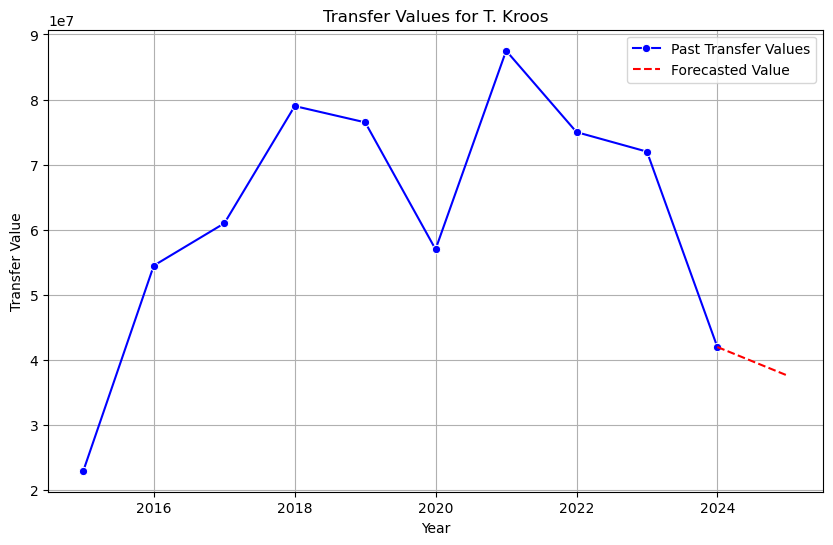

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.arima.model import ARIMA

# Function to plot transfer values with forecast using Seaborn
def plot_transfer_values(player_data, forecast_value):
    plt.figure(figsize=(10, 6))
    sns.lineplot(x=player_data.index, y=player_data.values, marker='o', color='blue', label='Past Transfer Values')
    forecast_date = player_data.index[-1] + pd.DateOffset(years=1)
    plt.plot([player_data.index[-1], forecast_date], 
             [player_data.values[-1], forecast_value], 
             linestyle='--', color='red', label='Forecasted Value')
    plt.xlabel('Year')
    plt.ylabel('Transfer Value')
    plt.title('Transfer Values for ' + player_name)
    plt.legend()
    plt.grid(True)
    plt.show()

# Assuming 'pivot_df' is your DataFrame containing the transfer values
# Let's choose a player from the index for forecasting, for example 'A. Abdi'

# User input for player name
player_name = input("Enter the player's name: ")

# Filter DataFrame for the specified player and replace NaN values with 0
player_data = pivot_df.loc[player_name].fillna(0)

# Convert index to datetime
player_data.index = pd.to_datetime(player_data.index, format='value_eur_%y.%f')

# Fit ARIMA model
model = ARIMA(player_data, order=(1, 1, 1))
arima_result = model.fit()

# Forecast future values
forecast = arima_result.forecast(steps=1)
forecast_value = forecast[0]  # Directly access the forecasted value

print("Forecasted Transfer Value for", player_name, "for the next year:", forecast_value)

# Plot transfer values with forecast using Seaborn
plot_transfer_values(player_data, forecast_value)


Enter the player's name:  T. Kroos


Forecasted Transfer Value for T. Kroos for the next year: 37584480.04381836


/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/var/folders/rj/r1xf594d5y1gk_5fvcg316qr0000gp/T/ipykernel_10352/1194241878.py:45: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  forecast_value = forecast[0]  # Directly access th

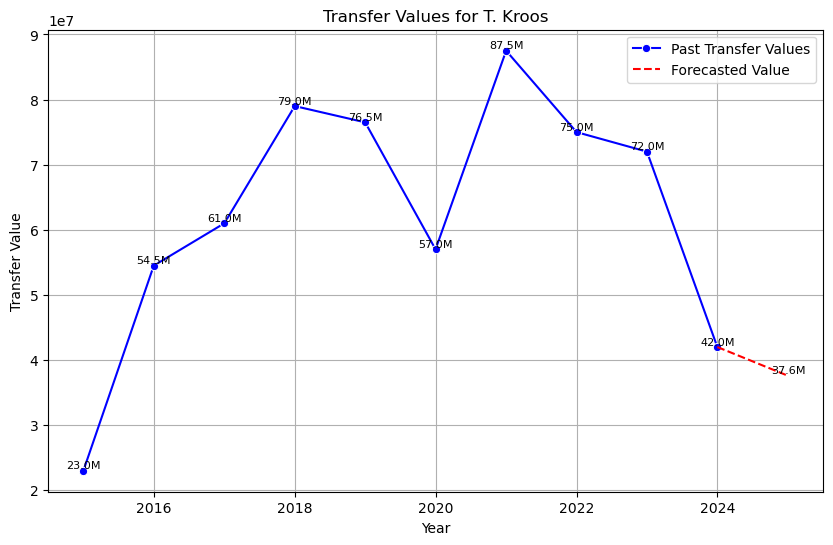

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.arima.model import ARIMA/;

# Function to plot transfer values with forecast using Seaborn
def plot_transfer_values(player_data, forecast_value):
    plt.figure(figsize=(10, 6))
    sns.lineplot(x=player_data.index, y=player_data.values, marker='o', color='blue', label='Past Transfer Values')
    forecast_date = player_data.index[-1] + pd.DateOffset(years=1)
    plt.plot([player_data.index[-1], forecast_date], 
             [player_data.values[-1], forecast_value], 
             linestyle='--', color='red', label='Forecasted Value')
    
    # Annotate each point with its value
    for i, value in enumerate(player_data.values):
        plt.text(player_data.index[i], value, str(int(value)), ha='center', va='bottom', fontsize=8)
    plt.text(forecast_date, forecast_value, str(int(forecast_value)), ha='center', va='bottom', fontsize=8)

    plt.xlabel('Year')
    plt.ylabel('Transfer Value')
    plt.title('Transfer Values for ' + player_name)
    plt.legend()
    plt.grid(True)
    plt.show()

# Assuming 'pivot_df' is your DataFrame containing the transfer values
# Let's choose a player from the index for forecasting, for example 'A. Abdi'

# User input for player name
player_name = input("Enter the player's name: ")

# Filter DataFrame for the specified player and replace NaN values with 0
player_data = pivot_df.loc[player_name].fillna(0)

# Convert index to datetime
player_data.index = pd.to_datetime(player_data.index, format='value_eur_%y.%f')

# Fit ARIMA model
model = ARIMA(player_data, order=(1, 1, 1))
arima_result = model.fit()

# Forecast future values
forecast = arima_result.forecast(steps=1)
forecast_value = forecast[0]  # Directly access the forecasted value

print("Forecasted Transfer Value for", player_name, "for the next year:", forecast_value)

# Plot transfer values with forecast using Seaborn
plot_transfer_values(player_data, forecast_value)


Player: V. Babacan


/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/var/folders/rj/r1xf594d5y1gk_5fvcg316qr0000gp/T/ipykernel_10352/3951966312.py:55: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  forecast_value_arima = forecast_arima[0]  # Direct

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
ARIMA Forecasted Transfer Value: 59292.844255725504
LSTM Forecasted Transfer Value: 1353459.4


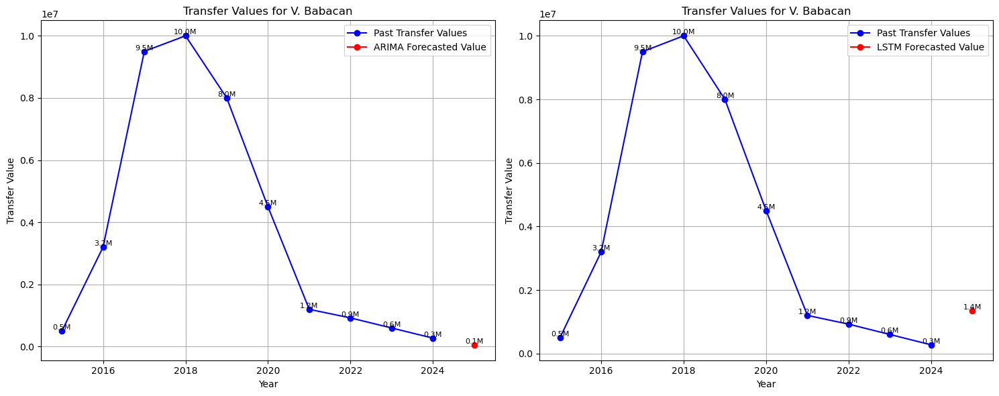

Player: T. Rieder


/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/var/folders/rj/r1xf594d5y1gk_5fvcg316qr0000gp/T/ipykernel_10352/3951966312.py:55: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  forecast_value_arima = forecast_arima[0]  # Direct

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
ARIMA Forecasted Transfer Value: 704947.7406828642
LSTM Forecasted Transfer Value: 844521.9


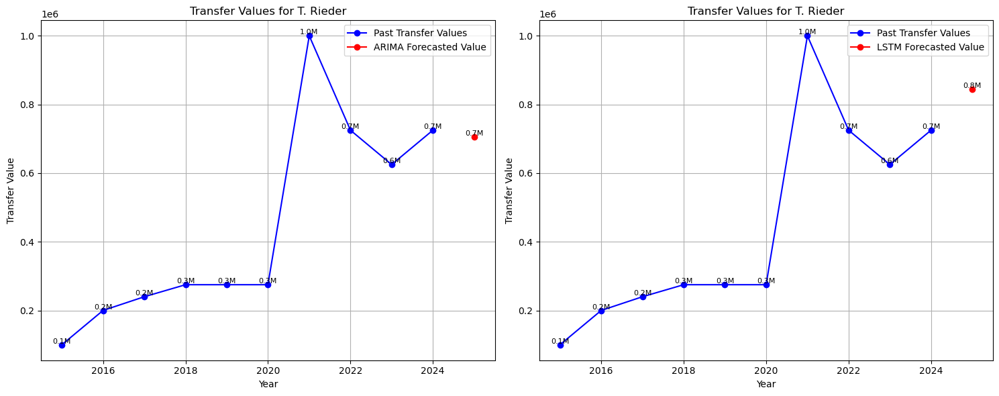

Player: S. Hedlund


/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/var/folders/rj/r1xf594d5y1gk_5fvcg316qr0000gp/T/ipykernel_10352/3951966312.py:55: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  forecast_value_arima = forecast_arima[0]  # Direct

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
ARIMA Forecasted Transfer Value: 1288150.8510519948
LSTM Forecasted Transfer Value: 1865836.2


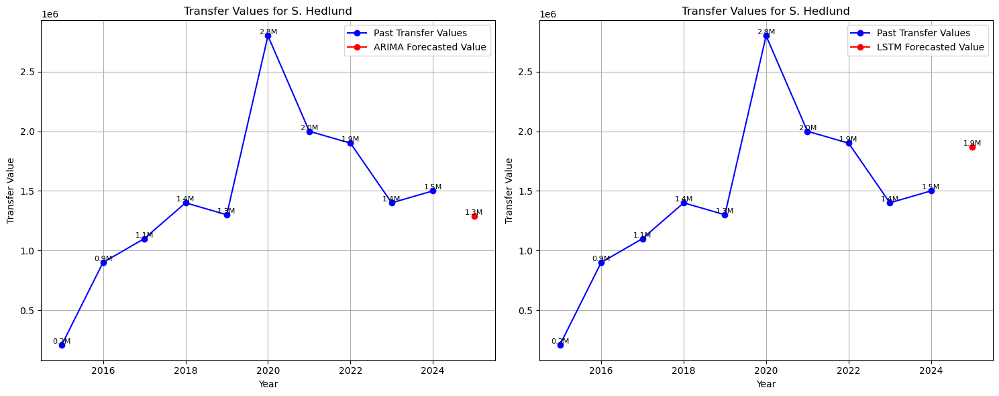

Player: P. Pekarík


/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/var/folders/rj/r1xf594d5y1gk_5fvcg316qr0000gp/T/ipykernel_10352/3951966312.py:55: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  forecast_value_arima = forecast_arima[0]  # Direct

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
ARIMA Forecasted Transfer Value: 1770.1266888408572
LSTM Forecasted Transfer Value: -165811.39


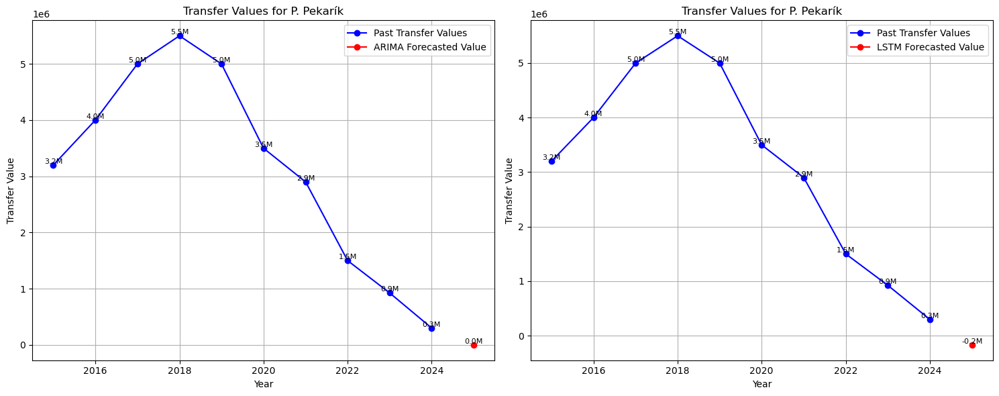

Player: Rober Correa


/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/var/folders/rj/r1xf594d5y1gk_5fvcg316qr0000gp/T/ipykernel_10352/3951966312.py:55: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  forecast_value_arima = forecast_arima[0]  # Direct

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
ARIMA Forecasted Transfer Value: 1306905.1171021096
LSTM Forecasted Transfer Value: 1723630.5


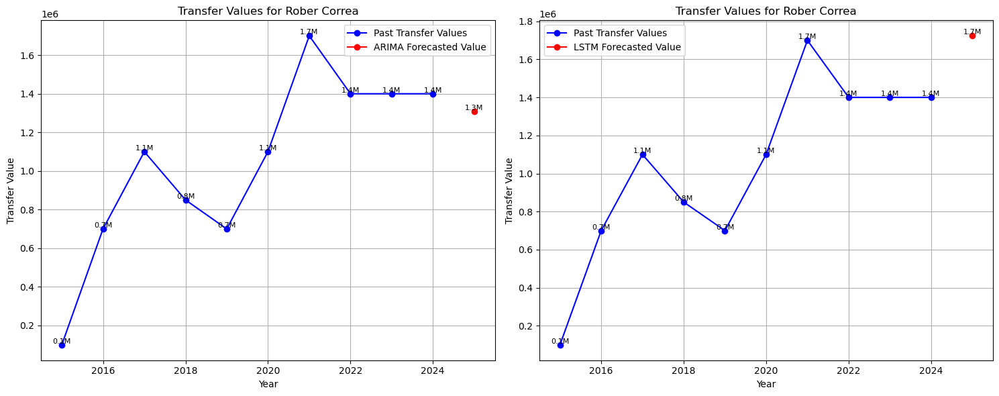

Player: E. Durm


/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/var/folders/rj/r1xf594d5y1gk_5fvcg316qr0000gp/T/ipykernel_10352/3951966312.py:55: FutureWarning: Series.__getitem__ treating keys a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
ARIMA Forecasted Transfer Value: 233550.24230771943
LSTM Forecasted Transfer Value: 1550295.9


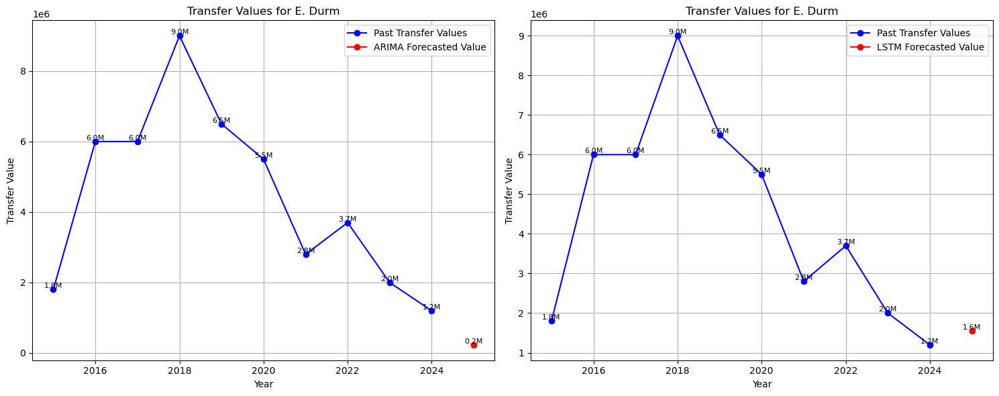

Player: F. Mendy


/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/var/folders/rj/r1xf594d5y1gk_5fvcg316qr0000gp/T/ipykernel_10352/3951966312.py:55: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  forecast_value_arima = forecast_arima[0]  # Direct

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
ARIMA Forecasted Transfer Value: 28857452.283931617
LSTM Forecasted Transfer Value: 30638404.0


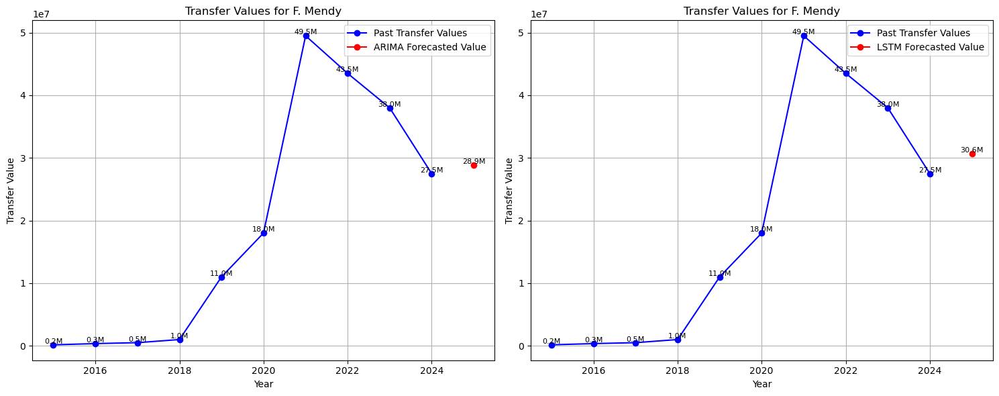

Player: W. Szczęsny


/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/var/folders/rj/r1xf594d5y1gk_5fvcg316qr0000gp/T/ipykernel_10352/3951966312.py:55: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  forecast_value_arima = forecast_arima[0]  # Direct

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
ARIMA Forecasted Transfer Value: 17070658.60436849
LSTM Forecasted Transfer Value: 17579308.0


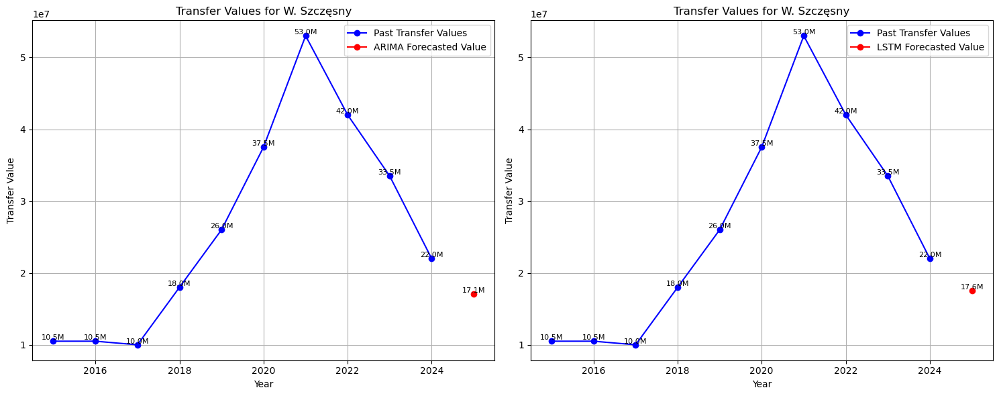

Player: M. Müller


/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/var/folders/rj/r1xf594d5y1gk_5fvcg316qr0000gp/T/ipykernel_10352/3951966312.py:55: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  forecast_value_arima = forecast_arima[0]  # Direct

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
ARIMA Forecasted Transfer Value: 3158789.9742197394
LSTM Forecasted Transfer Value: 2917940.2


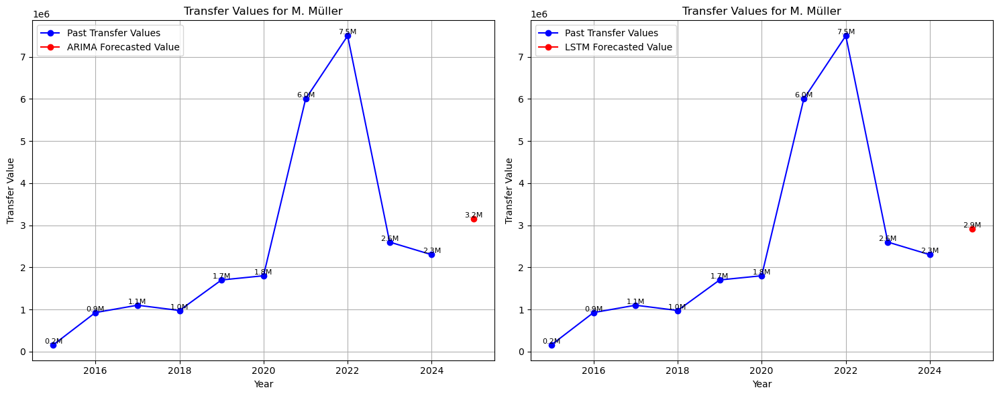

Player: J. Angulo


/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/var/folders/rj/r1xf594d5y1gk_5fvcg316qr0000gp/T/ipykernel_10352/3951966312.py:55: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  forecast_value_arima = forecast_arima[0]  # Direct

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
ARIMA Forecasted Transfer Value: 1060115.1037496862
LSTM Forecasted Transfer Value: 2686474.8


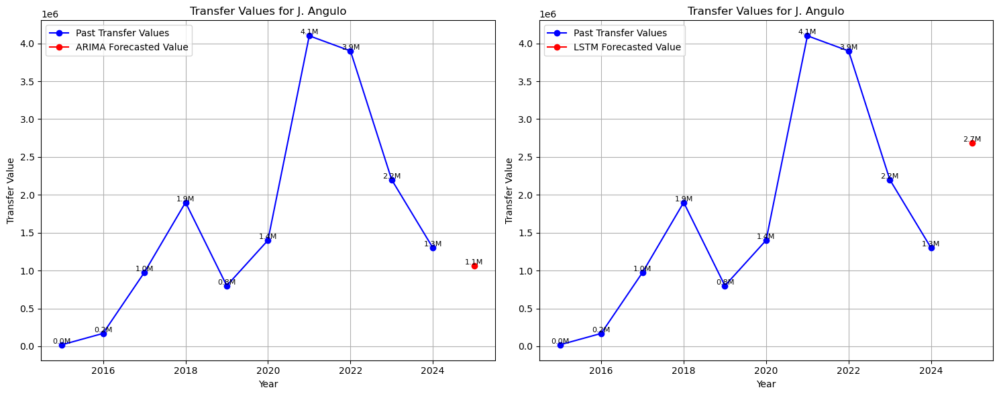

In [41]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.arima.model import ARIMA
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Function to create the LSTM model
def create_lstm_model(input_shape):
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=input_shape))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

# Function to plot transfer values with forecast using Seaborn
def plot_transfer_values(ax, player_data, forecast_value, forecast_date, model_name):
    ax.plot(player_data.index, player_data.values.ravel(), marker='o', color='blue', label='Past Transfer Values')
    ax.plot(forecast_date, forecast_value, marker='o', color='red', label=model_name + ' Forecasted Value')
    
    # Annotate each point with its value (in millions of euros)
    for i, value in enumerate(player_data.values):
        ax.text(player_data.index[i], value, '{:.1f}M'.format(value / 1e6), ha='center', va='bottom', fontsize=8)
    ax.text(forecast_date, forecast_value, '{:.1f}M'.format(forecast_value / 1e6), ha='center', va='bottom', fontsize=8)

    ax.set_xlabel('Year')
    ax.set_ylabel('Transfer Value')
    ax.set_title('Transfer Values for ' + player_name)
    ax.legend()
    ax.grid(True)

# Assuming 'pivot_df' is your DataFrame containing the transfer values

# Randomly select 10 players
random_players = np.random.choice(pivot_df.index, size=10, replace=False)

for player_name in random_players:
    print("Player:", player_name)
    
    # Filter DataFrame for the specified player and replace NaN values with 0
    player_data = pivot_df.loc[player_name].fillna(0)

    # Convert index to datetime
    player_data.index = pd.to_datetime(player_data.index, format='value_eur_%y.%f')

    # Fit ARIMA model
    model = ARIMA(player_data, order=(1, 1, 1))
    arima_result = model.fit()

    # Forecast future values using ARIMA
    forecast_arima = arima_result.forecast(steps=1)
    forecast_value_arima = forecast_arima[0]  # Directly access the forecasted value
    forecast_date_arima = player_data.index[-1] + pd.DateOffset(years=1)

    # Scale the data for LSTM model
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(player_data.values.reshape(-1, 1))

    # Prepare the data for LSTM model
    window_size = 5  # Adjust this based on the size of your dataset
    X, y = [], []
    for i in range(window_size, len(scaled_data)):
        X.append(scaled_data[i-window_size:i, 0])
        y.append(scaled_data[i, 0])
    X, y = np.array(X), np.array(y)
    X = np.reshape(X, (X.shape[0], X.shape[1], 1))

    # Create and fit the LSTM model
    model_lstm = create_lstm_model((X.shape[1], 1))
    model_lstm.fit(X, y, epochs=100, batch_size=32, verbose=0)

    # Make predictions using LSTM
    forecast_input = scaled_data[-window_size:].reshape(1, -1, 1)
    forecast_scaled = model_lstm.predict(forecast_input)
    forecast_value_lstm = scaler.inverse_transform(forecast_scaled)[0][0]
    forecast_date_lstm = player_data.index[-1] + pd.DateOffset(years=1)

    print("ARIMA Forecasted Transfer Value:", forecast_value_arima)
    print("LSTM Forecasted Transfer Value:", forecast_value_lstm)

    # Plot transfer values with forecast using Seaborn
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    plot_transfer_values(ax1, player_data, forecast_value_arima, forecast_date_arima, 'ARIMA')
    plot_transfer_values(ax2, player_data, forecast_value_lstm, forecast_date_lstm, 'LSTM')

    plt.tight_layout()
    plt.show()
